# Codigo para los MINI HALOS
# COEVAL

In [74]:
pip show 21cmFAST

Name: 21cmFAST
Version: 0.0.0
Summary: A semi-numerical cosmological simulation code for the 21cm signal
Home-page: https://github.com/21cmFAST/21cmFAST
Author: The 21cmFAST coredev team
Author-email: 21cmfast.coredev@gmail.com
License: MIT license
Location: /home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages
Requires: astropy, bidict, cached-property, cffi, click, h5py, matplotlib, numpy, pyyaml, scipy
Required-by: 21CMMC
Note: you may need to restart the kernel to use updated packages.


## __________________________________________________________________
## PARTE I : Rutinas
## PARTE II : Genero el cubo de DATOS (Coeval)
## PARTE III: Analisis de datos - Visualizacion de los campos en 2D y 3D
## PARTE IV: Tomografias ( $\delta$ , $\delta Tb$ , Tk, XHII )  junto a los Halos
## __________________________________________________________________

# PARTE I

In [75]:
import numpy as np

In [76]:
%matplotlib inline
import matplotlib.pyplot as plt
import os

import py21cmfast as p21c

# For plotting the cubes, we use the plotting submodule:
from py21cmfast import plotting

# For interacting with the cache
from py21cmfast import cache_tools

import h5py
import numpy as np

In [77]:
#import shutil

#cache_dir = '_cache'
#if os.path.exists(cache_dir):
#    shutil.rmtree(cache_dir)

In [78]:
if not os.path.exists('_cache'):
    os.mkdir('_cache')

p21c.config['direc'] = '_cache'
cache_tools.clear_cache(direc="_cache")

In [6]:
from py21cmfast import (
    AstroParams,
    CosmoParams,
    FlagOptions,
    UserParams,
    determine_halo_list,
    initial_conditions,
    perturb_field,
)

from py21cmfast._utils import StructInstanceWrapper
from py21cmfast.c_21cmfast import ffi, lib
import numpy as np

## Condiciones iniciales :  IC

In [79]:
initial_conditions = p21c.initial_conditions(            
         user_params = {                
        "BOX_LEN": 160.0,
        "DIM": 1024,
        "HII_DIM": 256,
        "NON_CUBIC_FACTOR": 1.0,
        "USE_FFTW_WISDOM": True,
        "HMF": 1,
        "USE_RELATIVE_VELOCITIES": True,
        "POWER_SPECTRUM": 5,
        "N_THREADS": 6,
        "PERTURB_ON_HIGH_RES": True,
        "NO_RNG": False,
        "USE_INTERPOLATION_TABLES": True,
        "FAST_FCOLL_TABLES": True,
        "USE_2LPT": True,
        "MINIMIZE_MEMORY": False,
        #"KEEP_3D_VELOCITIES": False,
    },         
        
        cosmo_params = { "OMb":0.0486, 
        "OMm": 0.31, 
        "POWER_INDEX": 0.97, 
        "SIGMA_8": 0.81, 
        "hlittle": 0.68, 
         },
    
    
    
    

        random_seed = 902495069184, 
        
        regenerate=False,
        write=True, # usar True !!!!!
    )

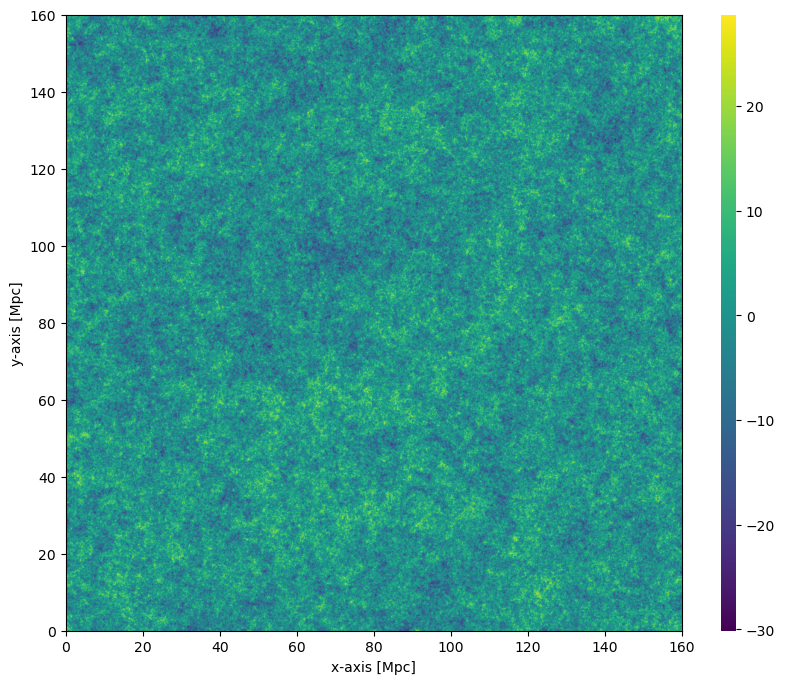

In [81]:
# CON MINI HALOS
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(initial_conditions, "hires_density", slice_axis=-1, slice_index=0, cbar=True, cmap='viridis', ax=ax,)    
#plotting.coeval_sliceplot(initial_conditions, "hires_density",slice_index=0 );
plt.savefig('IC con mini Halos.jpg', dpi=300, bbox_inches='tight')

In [82]:
p21c.CosmoParams._defaults_

{'SIGMA_8': 0.8102,
 'hlittle': 0.6766,
 'OMm': 0.30964144154550644,
 'OMb': 0.04897468161869667,
 'POWER_INDEX': 0.9665}

In [83]:
initial_conditions.cosmo_params

CosmoParams(OMb:0.0486, OMm:0.31, POWER_INDEX:0.97, SIGMA_8:0.81, hlittle:0.68)

In [84]:
initial_conditions.cosmo_params.cosmo

FlatLambdaCDM(name="Planck15 (modified)", H0=68.0 km / (Mpc s), Om0=0.31, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.0486)

In [85]:
print(initial_conditions)

InitialConditions(UserParams(BOX_LEN:160, DIM:1024, FAST_FCOLL_TABLES:True, HII_DIM:256, HMF:1, MINIMIZE_MEMORY:False, NON_CUBIC_FACTOR:1, NO_RNG:False, N_THREADS:6, PERTURB_ON_HIGH_RES:True, POWER_SPECTRUM:5, USE_2LPT:True, USE_FFTW_WISDOM:True, USE_INTERPOLATION_TABLES:True, USE_RELATIVE_VELOCITIES:True);
	CosmoParams(OMb:0.0486, OMm:0.31, POWER_INDEX:0.97, SIGMA_8:0.81, hlittle:0.68);
	random_seed:902495069184)


In [86]:
initial_conditions.fieldnames

['lowres_density',
 'lowres_vx',
 'lowres_vy',
 'lowres_vz',
 'lowres_vx_2LPT',
 'lowres_vy_2LPT',
 'lowres_vz_2LPT',
 'hires_density',
 'hires_vx',
 'hires_vy',
 'hires_vz',
 'hires_vx_2LPT',
 'hires_vy_2LPT',
 'hires_vz_2LPT',
 'lowres_vcb']

In [13]:
initial_conditions

InitialConditions(UserParams(BOX_LEN:160, DIM:512, FAST_FCOLL_TABLES:True, HII_DIM:256, HMF:1, MINIMIZE_MEMORY:False, NON_CUBIC_FACTOR:1, NO_RNG:False, N_THREADS:6, PERTURB_ON_HIGH_RES:True, POWER_SPECTRUM:5, USE_2LPT:True, USE_FFTW_WISDOM:True, USE_INTERPOLATION_TABLES:True, USE_RELATIVE_VELOCITIES:True); CosmoParams(OMb:0.0486, OMm:0.31, POWER_INDEX:0.97, SIGMA_8:0.81, hlittle:0.68); GlobalParams(CRIT_DENS_TRANSITION=1.5;DELTA_CRIT_MODE=1;DELTA_R_FACTOR=1.100000023841858;FILTER=0;HALO_FILTER=0;MIN_DENSITY_LOW_LIMIT=9.000000034120603e-08;M_MAX_INTEGRAL=1.0000000272564224e+16;M_MIN_INTEGRAL=100000.0;M_WDM=2.0;NBINS_LF=100;OMk=0.0;OMn=0.0;OMr=8.600000001024455e-05;OMtot=1.0;OPTIMIZE=0;OPTIMIZE_MIN_MASS=99999997952.0;P_CUTOFF=0;PhotonConsAsymptoteTo=0.009999999776482582;PhotonConsEnd=0.30000001192092896;PhotonConsEndCalibz=3.5;PhotonConsStart=0.9950000047683716;R_BUBBLE_MIN=0.6203504800796509;R_OVERLAP_FACTOR=1.0;RecombPhotonCons=0;SHETH_b=0.15000000596046448;SHETH_c=0.05000000074505806;

#  ____________________________________________________________

# PARTE II
# _______________________Genero el Coeval_______________________
## En este caso usamos el USE_MINI_HALOS 

In [80]:
coeval = p21c.run_coeval(
    redshift = 10,
    random_seed = initial_conditions.random_seed,
    user_params = initial_conditions.user_params,                              
 
    flag_options={ 
        "USE_HALO_FIELD": False,
        "USE_MINI_HALOS": True,
        "USE_CMB_HEATING": True,
        "USE_LYA_HEATING": True,
        "USE_MASS_DEPENDENT_ZETA": True, # mini = True, Halos= False
        "SUBCELL_RSD": False,
        "APPLY_RSDS": True,
        "INHOMO_RECO": True,
        "USE_TS_FLUCT": True,
        "M_MIN_in_Mass": True,
        "PHOTON_CONS": False,
        "FIX_VCB_AVG": True, # mini = True, Halos= False
    } , 
    
    
    cosmo_params = initial_conditions.cosmo_params,
    
    astro_params ={
        "HII_EFF_FACTOR": 30.0,
        "F_STAR10": -1.3,
        "F_STAR7_MINI": -2.22, # use estandard = -2.22
        "ALPHA_STAR": 0.5,
        "ALPHA_STAR_MINI": 0.5,
        "F_ESC10": -1.0,
        "F_ESC7_MINI": -2.5,
        "ALPHA_ESC": -0.5,
        "M_TURN": 8.7,
        "R_BUBBLE_MAX": None,
        "ION_Tvir_MIN": 4.69897,
        "L_X": 40.0,
        "L_X_MINI": 40.0,
        "NU_X_THRESH": 500.0,
        "X_RAY_SPEC_INDEX": 1.0,
        "X_RAY_Tvir_MIN": None,
        "F_H2_SHIELD": 0.0,
        "t_STAR": 0.5,
        "N_RSD_STEPS": 20,
        "A_LW": 2.00,
        "BETA_LW": 0.6,
        "A_VCB": 1.0,
        "BETA_VCB": 1.8,
    },
 
   
    
    regenerate=None,
    write=True,
    direc=None,
    
)

/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:400: UserWarning: The following parameters to FlagOptions are not supported: ['USE_VELS_AUX', 'APPLY_RSDS']
  warnings.warn(
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:815: UserWarning: Trying to remove array that isn't yet created: lowres_density
  warnings.warn(f"Trying to remove array that isn't yet created: {k}")
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:815: UserWarning: Trying to remove array that isn't yet created: lowres_vx
  warnings.warn(f"Trying to remove array that isn't yet created: {k}")
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:815: UserWarning: Trying to remove array that isn't yet created: lowres_vy
  warnings.warn(f"Trying to remove array that isn't yet created: {k}")
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.

In [87]:
!python --version

Python 3.10.11


In [88]:
coeval.init_struct.write

<bound method OutputStruct.write of InitialConditions(UserParams(BOX_LEN:160, DIM:1024, FAST_FCOLL_TABLES:True, HII_DIM:256, HMF:1, MINIMIZE_MEMORY:False, NON_CUBIC_FACTOR:1, NO_RNG:False, N_THREADS:6, PERTURB_ON_HIGH_RES:True, POWER_SPECTRUM:5, USE_2LPT:True, USE_FFTW_WISDOM:True, USE_INTERPOLATION_TABLES:True, USE_RELATIVE_VELOCITIES:True); CosmoParams(OMb:0.0486, OMm:0.31, POWER_INDEX:0.97, SIGMA_8:0.81, hlittle:0.68); GlobalParams(CRIT_DENS_TRANSITION=1.5;DELTA_CRIT_MODE=1;DELTA_R_FACTOR=1.100000023841858;FILTER=0;HALO_FILTER=0;MIN_DENSITY_LOW_LIMIT=9.000000034120603e-08;M_MAX_INTEGRAL=1.0000000272564224e+16;M_MIN_INTEGRAL=100000.0;M_WDM=2.0;NBINS_LF=100;OMk=0.0;OMn=0.0;OMr=8.600000001024455e-05;OMtot=1.0;OPTIMIZE=0;OPTIMIZE_MIN_MASS=99999997952.0;P_CUTOFF=0;PhotonConsAsymptoteTo=0.009999999776482582;PhotonConsEnd=0.30000001192092896;PhotonConsEndCalibz=3.5;PhotonConsStart=0.9950000047683716;R_BUBBLE_MIN=0.6203504800796509;R_OVERLAP_FACTOR=1.0;RecombPhotonCons=0;SHETH_b=0.150000005

 DELTA_CRIT_MODE : int
 
        The delta_crit to be used for determining whether a halo exists in a cell
        
            0: delta_crit is constant (i.e. 1.686)
            
            1: delta_crit is the sheth tormen ellipsoidal collapse correction to delta_crit
            
            
https://21cmfast.readthedocs.io/en/latest/_modules/py21cmfast/inputs.html#            


### `DELTA_CRIT_MODE : int`

Este parámetro se refiere a cómo se calcula la densidad crítica ($(\delta_{\text{crit}}$)) para determinar si existe un halo (una región densa de materia) en una celda del espacio en simulaciones cosmológicas. La elección del modo influye en cómo se identifican y clasifican estos halos.

### Opciones para `DELTA_CRIT_MODE`:

1. **`0: delta_crit es constante (i.e. 1.686)`**
   - En este modo, la densidad crítica se mantiene constante con un valor de 1.686. Este valor proviene del colapso de materia en el universo y se basa en el modelo de colapso esférico. Usar un valor constante simplifica los cálculos, pero puede no reflejar variaciones en la estructura del universo.

2. **`1: delta_crit es la corrección de colapso elipsoidal de Sheth-Tormen`**
   - En este modo, la densidad crítica varía y se calcula utilizando la corrección de colapso elipsoidal propuesta por Sheth y Tormen. Este enfoque es más sofisticado y tiene en cuenta que la forma de las perturbaciones de densidad no es siempre esférica (es decir, pueden ser elipsoidales). Esto puede resultar en una identificación más precisa de los halos, ya que considera factores como la anisotropía en la distribución de la materia.


# _________________________________________________________________

# PARTE III
# Analisis de DATOS

## 1 - Campo de densidad

In [89]:
type(coeval)

py21cmfast.outputs.Coeval

In [90]:
coeval.random_seed

902495069184

In [91]:
coeval.random_seed

902495069184

In [92]:
coeval.density

array([[[ 1.78154334e-01,  3.16688538e+00,  1.63773298e+00, ...,
          1.06062746e+00,  2.53098154e+00,  2.69611025e+00],
        [ 4.40868855e+00,  3.17192411e+00,  1.50630832e+00, ...,
          1.57512450e+00,  1.80094886e+00,  2.12269354e+00],
        [ 3.43095064e+00,  1.09092152e+00,  2.68652868e+00, ...,
          1.62173605e+00,  4.83883262e-01,  7.61145771e-01],
        ...,
        [-1.35572776e-01,  4.11267787e-01,  1.92954838e-01, ...,
          4.25234377e-01,  1.45521283e+00,  8.53353739e-01],
        [ 1.02573507e-01,  2.51755118e-01, -4.60902005e-02, ...,
         -4.05125618e-02, -2.89324373e-02,  4.41954061e-02],
        [-6.46514446e-02,  1.26841044e+00,  1.35269594e+00, ...,
          2.58728653e-01,  2.65143633e-01, -3.81286800e-01]],

       [[ 3.79179299e-01,  1.42922893e-01,  4.42565352e-01, ...,
          4.33561593e-01,  7.88339496e-01,  3.82016450e-01],
        [ 1.36301887e+00,  1.17953944e+00,  7.59521186e-01, ...,
          1.07888266e-01,  5.94075263e

In [93]:
coeval.density.shape

(256, 256, 256)

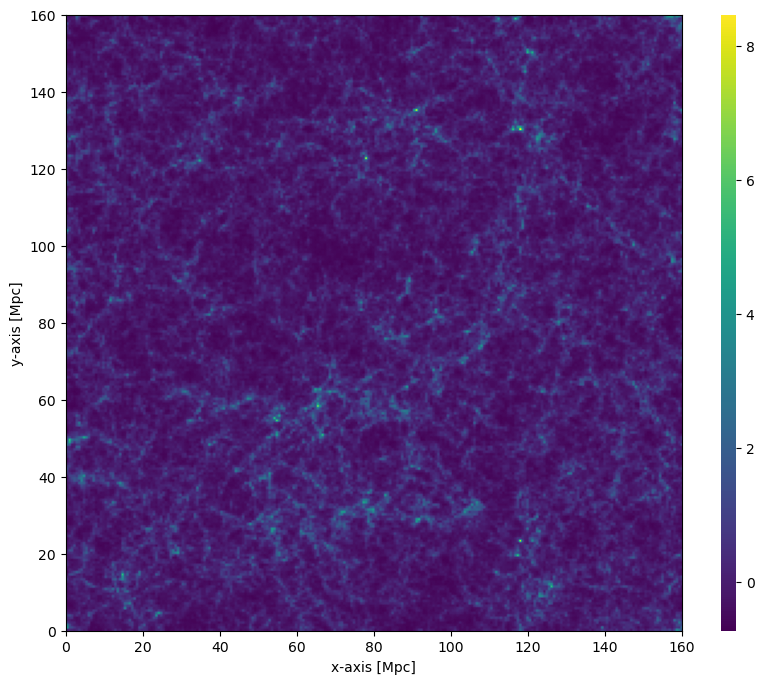

In [94]:
# densisad CON mini halos

#plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=6)
#plt.savefig('densityCONmini.jpg', dpi=300, bbox_inches='tight')


fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0, cbar=True, cmap='viridis', ax=ax)
plt.savefig('densityCONmini.jpg', dpi=300, bbox_inches='tight')


# PARTE III-A

#  PLOTS : De los distintos campos generados del COEVAL
## PLOT : Campo de  DENSIDAD   ($\delta$)

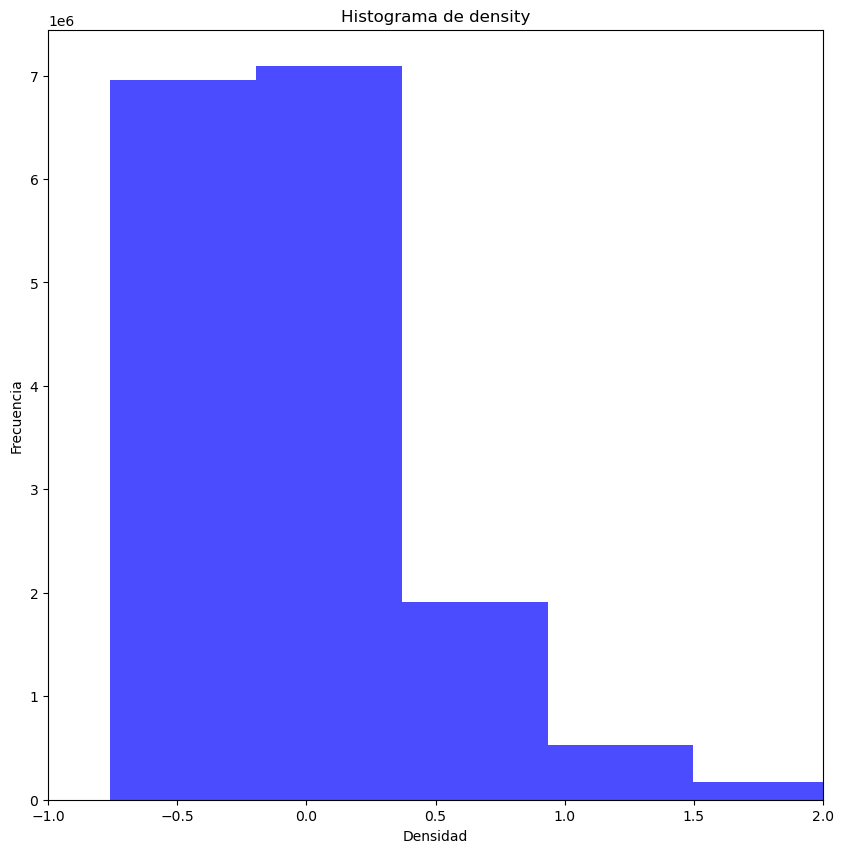

In [95]:
import matplotlib.pyplot as plt



plt.hist(coeval.density.flatten(), bins=30, color='blue', alpha=0.7)
plt.title('Histograma de density')
plt.xlabel('Densidad')
plt.xlim(-1,2)
plt.ylabel('Frecuencia')
plt.show()


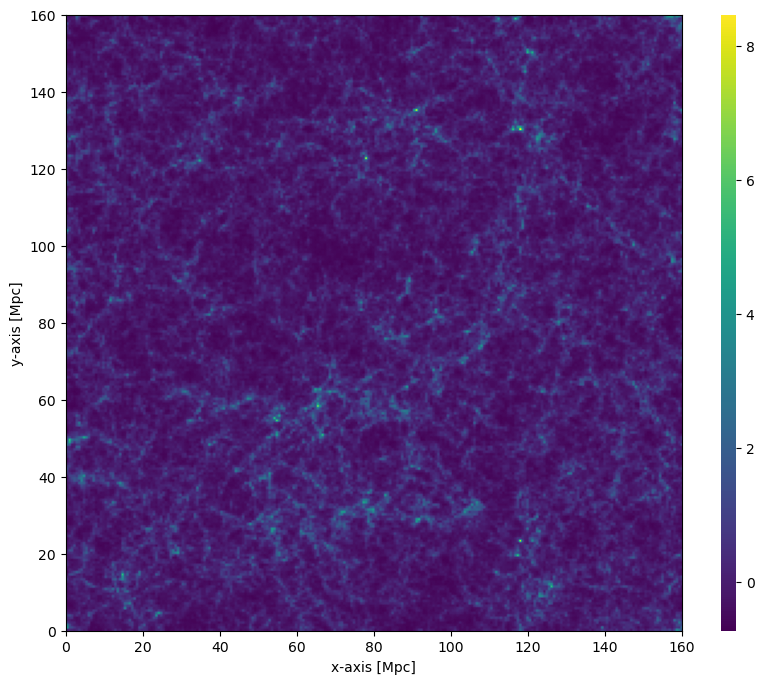

In [96]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
#plt.savefig('densityCONmini.jpg', dpi=300, bbox_inches='tight')




#plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0)

#plt.savefig('densityCONmini.jpg', dpi=300, bbox_inches='tight')

## PLOT : Temperatura de BRILLO  ($\Delta Tb$)

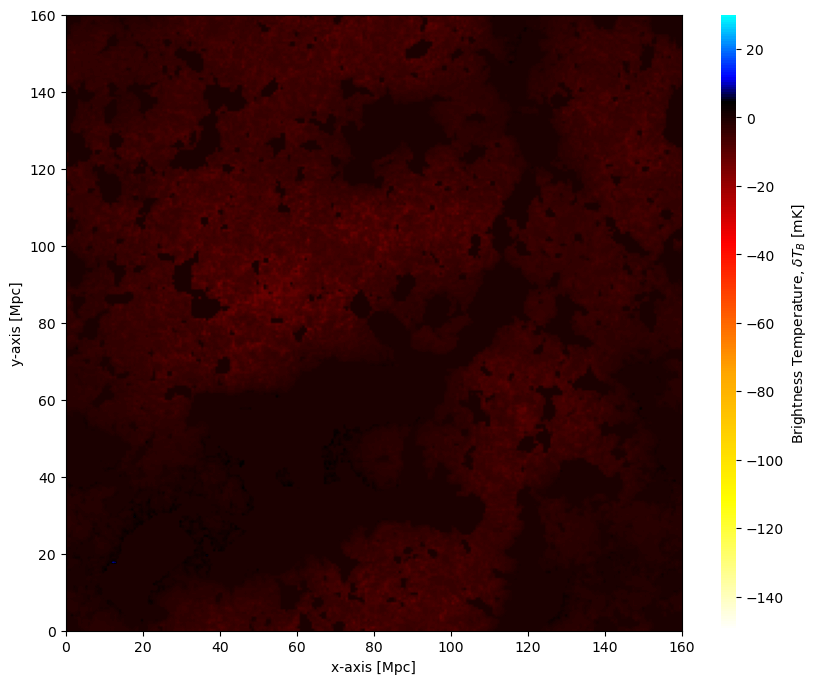

In [97]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
#plt.savefig('densityCONmini.jpg', dpi=300, bbox_inches='tight')
plt.savefig('brightness_tempCONmini.jpg', dpi=300, bbox_inches='tight')

In [213]:
#coeval.brightness_temp

In [99]:
#plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=0)
#plt.savefig('brightness_tempSINmini.jpg', dpi=300, bbox_inches='tight')

## PLOT: Temperatura cinetica del GAS   (Tk)

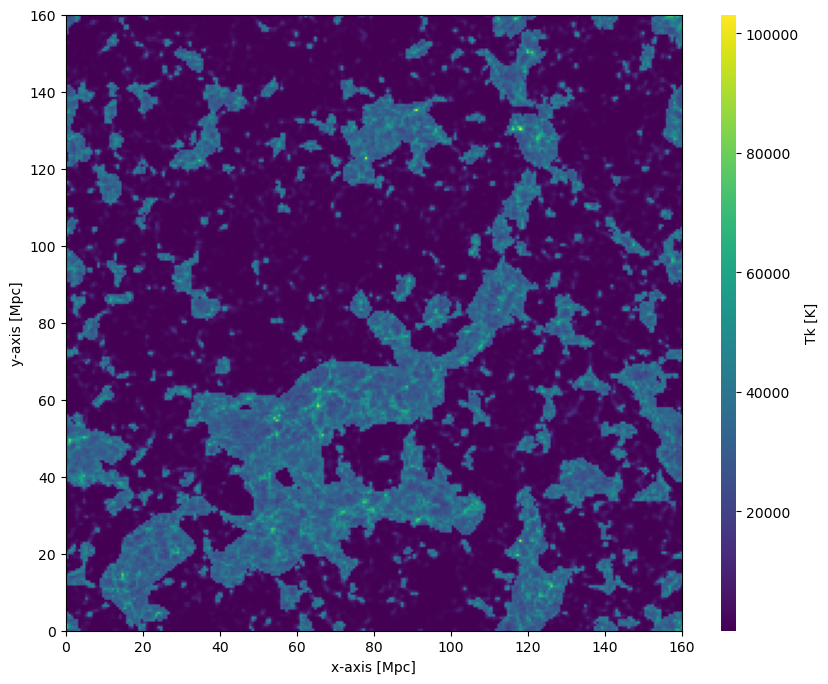

In [100]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=0, cbar=True, ax=ax, cbar_label='Tk [K]')

#plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=6)
plt.savefig('temp_kineticCONmini.jpg', dpi=300, bbox_inches='tight')

In [212]:
#coeval.temp_kinetic_all_gas

## PLOT:  Campo IONIZANTE  ( XHII )

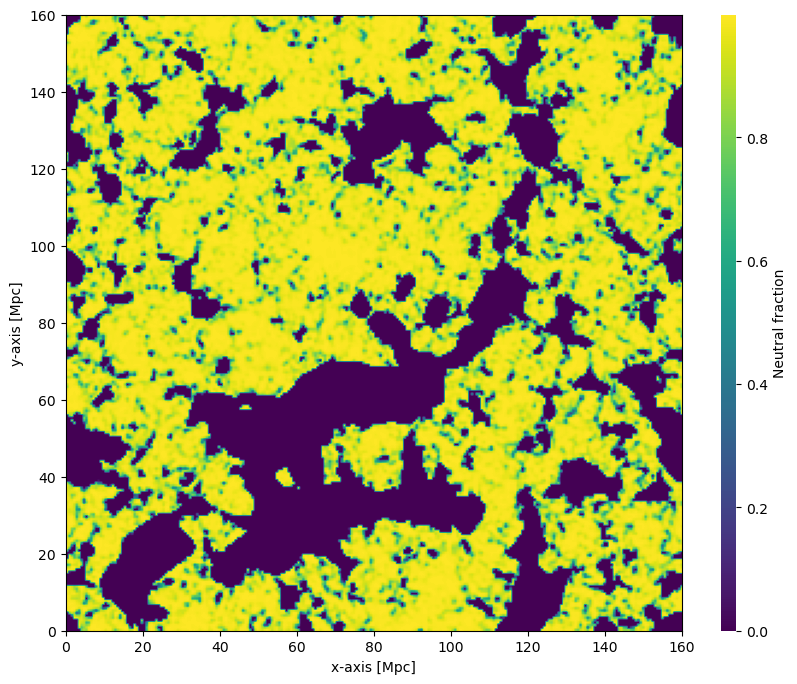

In [102]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0, cbar=True, ax=ax)


#plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6)
plt.savefig('IonizanteCONmini.jpg', dpi=300, bbox_inches='tight')

In [211]:
#coeval.xH_box

In [104]:
#plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0)
#plt.savefig('IonizanteSINmini.jpg', dpi=300, bbox_inches='tight')

## PLOT:  Temperatura de SPIN  (Ts)

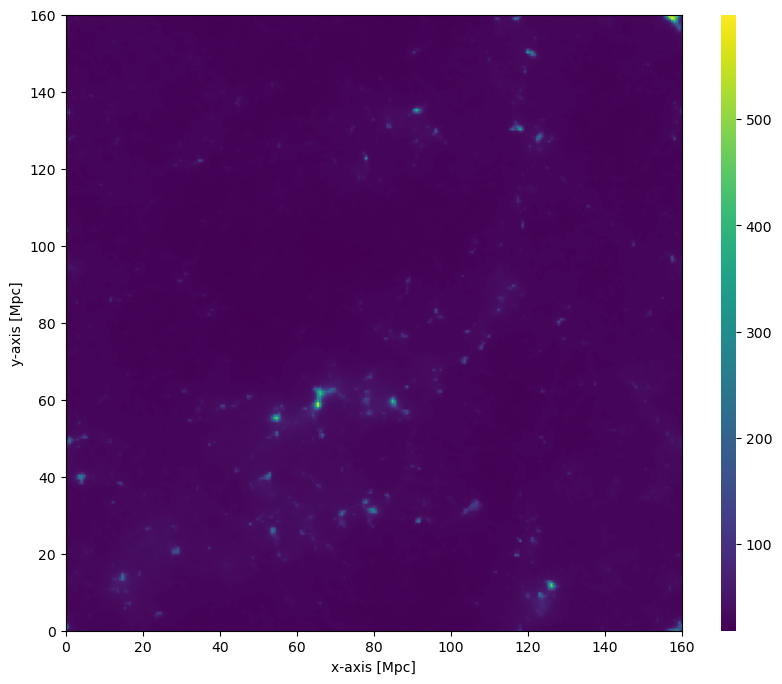

In [105]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "Ts_box", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
#plotting.coeval_sliceplot(coeval, "Ts_box",slice_axis=-1, slice_index=6)
plt.savefig('temp_spinCONmini.jpg', dpi=300, bbox_inches='tight')

In [106]:
# comprobando que todo este bien...
#plotting.coeval_sliceplot(coeval, "Ts_box")

# PARTE III-B

## 2 - Halos de DM

### 2.1 -  Primero genero los halos de DM
### 2.2 a- Visualizaicon de los datos : PLot de densidad ($\delta$) en 2D y 3D
### 2.2 b- Visualizaicon de los datos : PLot de los Halos en 2D y3D
### 2.2 c - Visualizacion de los datos : Densidad y halos en 3D 

## 2 -1 Genero la lista de HALOS

In [107]:
halos = determine_halo_list(
        redshift= coeval.redshift ,
        init_boxes= initial_conditions,
        user_params=coeval.user_params,
        cosmo_params=coeval.cosmo_params,
        astro_params=coeval.astro_params,
        flag_options=coeval.flag_options,
        regenerate=False,
        write=True,
        OPTIMIZE=False,
    )


/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:400: UserWarning: The following parameters to FlagOptions are not supported: ['USE_VELS_AUX']
  warnings.warn(


In [108]:
halos.halo_masses.shape

(1403480,)

In [109]:
halos.halo_masses.min()

506199140.0

In [110]:
halos.halo_masses.max()

205145130000.0

In [111]:
halos.halo_coords.shape

(1403480, 3)

In [112]:
halos.halo_coords

array([[   0,    0,    5],
       [   0,    0,  277],
       [   0,    0,  672],
       ...,
       [1023, 1022,    5],
       [1023, 1023,    0],
       [1023, 1023,    4]], dtype=int32)

##  ● PLot 3D de los HALOS

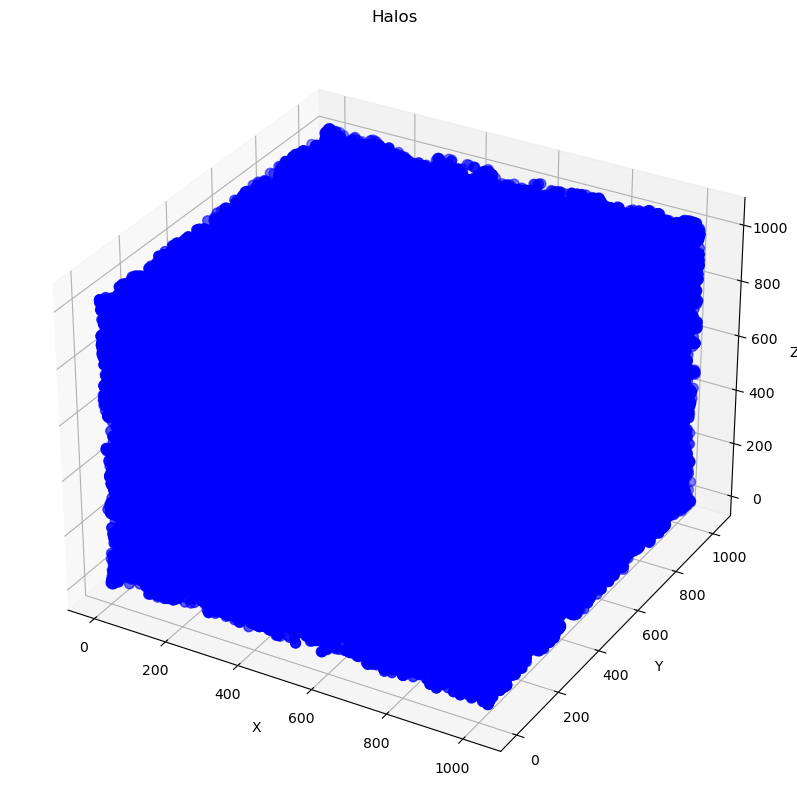

In [113]:
# PLOTS EN 3D  DEL LOS HALOS
#  Cuidado con las dimensiones !!!

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


datos =  halos.halo_coords 

#las coordenadas x, y, z de los datos
x_1 = datos[:, 0]
y_2 = datos[:, 1]
z_3 = datos[:, 2]

# PLot

fig = plt.figure(figsize=(12, 10))   

ax = fig.add_subplot(111, projection='3d')

ax.scatter(x_1, y_2, z_3, c='b', marker='o',s=50)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Halos')

plt.show()

In [114]:
x_1

array([   0,    0,    0, ..., 1023, 1023, 1023], dtype=int32)

In [115]:
y_2

array([   0,    0,    0, ..., 1022, 1023, 1023], dtype=int32)

In [116]:
z_3

array([  5, 277, 672, ...,   5,   0,   4], dtype=int32)

### Acordate que :


En el el código 21cmFAST, el número DIM= `809` se refiere al índice en la cuadrícula (o rejilla) que definimos en la simulación. o sea, teniamos....

1. Definición del tamaño del BOX: En esta configuración, definimos un `BOX_LEN` de 150.0 Mpc. Esto significa que la simulación abarca un volumen cúbico de 150 Mpc en cada dimensión (X, Y, Z).

2. Definición de la cuadrícula: La dimensión de la cuadrícula (`DIM`) a 812. Esto significa que el espacio de la simulación se divide en una cuadrícula de $( 812 \times 812 \times 812 )$ celdas.

3. Resolución de la cuadrícula: Cada celda de la cuadrícula representa una parte del volumen total. La resolución de cada celda en términos de longitud es:
   $
   \text{Resolución} = \frac{\text{BOX\_LEN}}{\text{DIM}} = \frac{150.0 \text{ Mpc}}{812} \approx 0.184 \text{ Mpc/celda}
   $

4. Interpretación de las coordenadas: Los índices  (por ejemplo, `809`) son posiciones dentro de esta cuadrícula. Por lo tanto, un índice de `809` en una dimensión representa una posición muy cercana al borde del box, pero no más allá de él.

   - Posición física: Para convertir un índice a una posición física en Mpc, usamos la fórmula:
     $\
     \text{Posición en Mpc} = \text{Índice} \times \text{Resolución} - \frac{\text{BOX\_LEN}}{2}
     \$
     
     En este caso, para el índice `809` en una dimensión:
       $\
       \text{Posición en Mpc} = 809 \times 0.184 - \frac{150.0}{2} \approx 148.56 - 75 = 73.56 \text{ Mpc}
       \$
       
       
       Esto indica que el índice `809` está muy cerca del borde superior del box en esa dimensión.



In [117]:
x_1.max()

1023

In [118]:
y_2.max()

1023

In [119]:
z_3.max()

1023

In [120]:
halos.halo_coords.max()

1023

### Halos en rebanadas 2D, en coordenadas  (DIM,DIM,DIM)

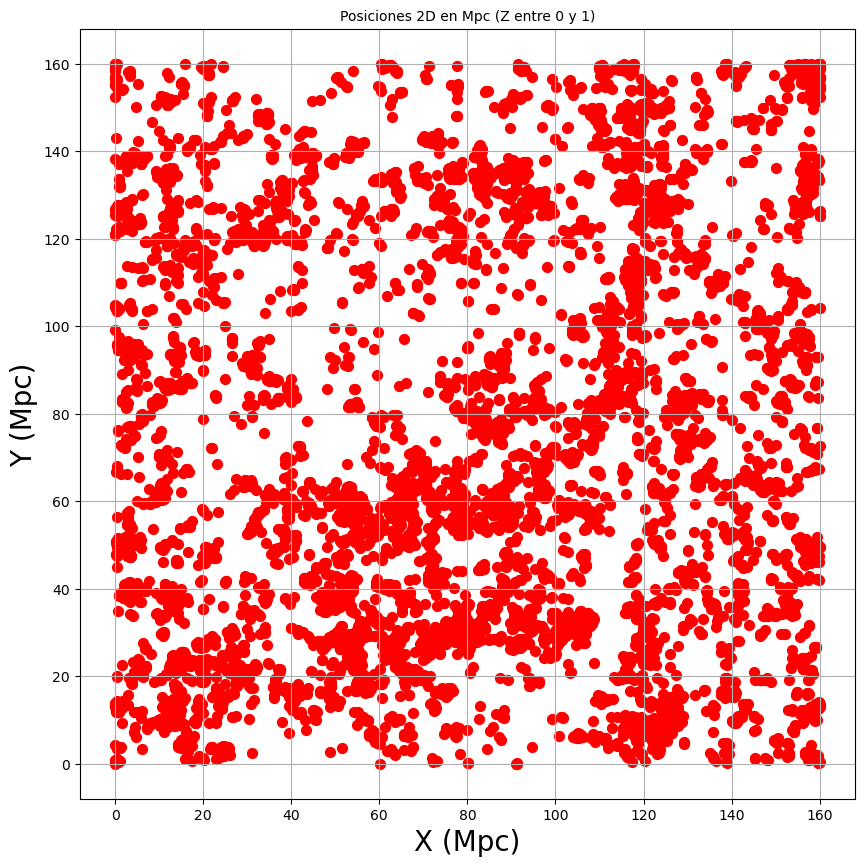

In [124]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM_1 = halos.halo_coords.max()
#DIM_1 = 511
DIM_1 = 1023


#DIM_1 = 255


# Nuevos nombres para las coordenadas de halos
halo_x_indices = x_1
halo_y_indices = y_2
halo_z_indices = z_3

# Función para convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM_):
    return (BOX_LEN / DIM_1) * index



# Convertir índices a posiciones en Mpc
positions_x_mpc = index_to_mpc(halo_x_indices, BOX_LEN, DIM_1)
positions_y_mpc = index_to_mpc(halo_y_indices, BOX_LEN, DIM_1)
positions_z_mpc = index_to_mpc(halo_z_indices, BOX_LEN, DIM_1)

zmin = 0  # Mínimo valor de z en Mpc
zmax = 1 # Máximo valor de z en Mpc

 
mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)

 
filtered_positions_x_mpc = positions_x_mpc[mask]
filtered_positions_y_mpc = positions_y_mpc[mask]


plt.figure(figsize=(10, 10))
plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='r', marker='o', s=50)

plt.xlabel('X [Mpc]', fontsize=20)
plt.ylabel('Y [Mpc]', fontsize=20)
#plt.legend(loc='upper right', fontsize=10)
    
    
plt.xlabel('X (Mpc)')
plt.ylabel('Y (Mpc)')
plt.title(f'Posiciones 2D en Mpc (Z entre {zmin} y {zmax})' , fontsize=10)
plt.grid(True)

plt.savefig('Halos.jpg', dpi=300, bbox_inches='tight')

plt.show()

## ● Cambio de coordenadas para los HALOS  para 3D

## <span style="color: red;">El problema aca es que tengo un box de 256x256x256 incrustado en 160x160x160.</span>


In [50]:
coeval.user_params.DIM

512

In [125]:
import numpy as np

# Parámetros de la simulación

BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()
#DIM = 511
DIM = 1023



#BOX_LEN = 160.0  # Mpc
#DIM = 254  # Número de celdas en una dimensión

#BOX_LEN = coeval.user_params.BOX_LEN # Mpc
#DIM = coeval.user_params.DIM
#DIM = 255


indices_x = x_1
indices_y = y_2
indices_z = z_3

# ahora convierto los índices a posiciones en Mpc, o sea defino una funcion para transformar ls coordenadas
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN/DIM)*index
    #return (index / DIM) * BOX_LEN


positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

#print("Posiciones en Mpc para x:")
#print(positions_x_mpc)

#print("Posiciones en Mpc para y:")
#print(positions_y_mpc)

#print("Posiciones en Mpc para z:")
#print(positions_z_mpc)


if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    print("Posiciones 3D en Mpc:")
    print(positions_3d_mpc)


Posiciones 3D en Mpc:
[[  0.           0.           0.78201369]
 [  0.           0.          43.32355816]
 [  0.           0.         105.1026393 ]
 ...
 [160.         159.84359726   0.78201369]
 [160.         160.           0.        ]
 [160.         160.           0.62561095]]


In [126]:
print("Posiciones en Mpc para x:")
print(positions_x_mpc)

Posiciones en Mpc para x:
[  0.   0.   0. ... 160. 160. 160.]


In [127]:
positions_x_mpc.shape

(1403480,)

In [128]:
positions_x_mpc.max()

160.0

In [129]:
print("Posiciones en Mpc para y:")
print(positions_y_mpc)

Posiciones en Mpc para y:
[  0.           0.           0.         ... 159.84359726 160.
 160.        ]


In [130]:
positions_y_mpc.max()

160.0

In [131]:
print("Posiciones en Mpc para z:")
print(positions_z_mpc)


Posiciones en Mpc para z:
[  0.78201369  43.32355816 105.1026393  ...   0.78201369   0.
   0.62561095]


In [132]:
positions_z_mpc.max()

160.0

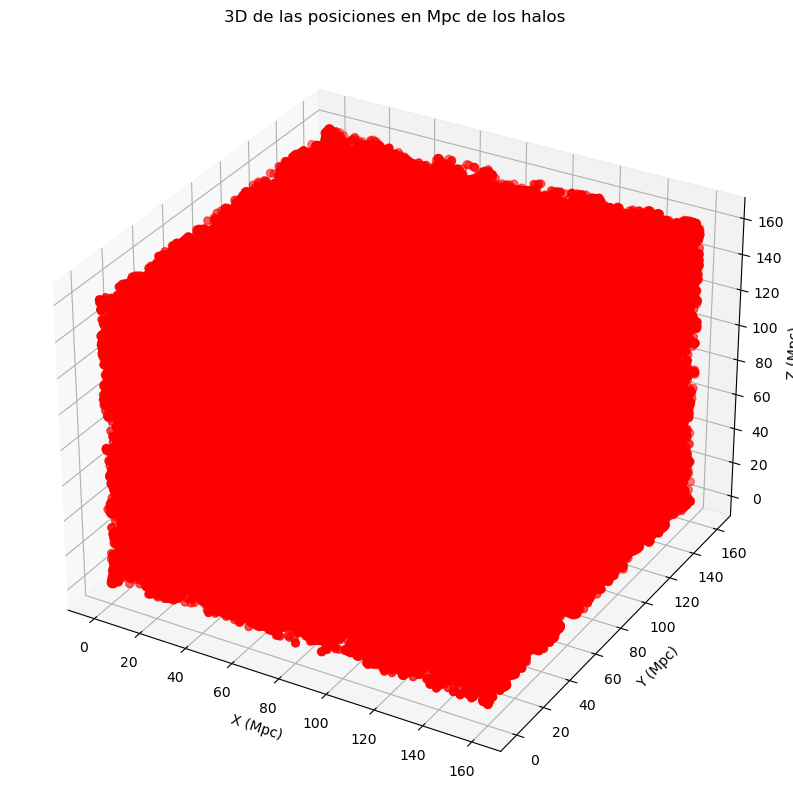

In [133]:
if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    #print("Posiciones 3D en Mpc:")
    #print(positions_3d_mpc)

    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

 
    ax.scatter(positions_x_mpc, positions_y_mpc, positions_z_mpc, c='r', marker='o',s=30)

  
    ax.set_xlabel('X (Mpc)')
    ax.set_ylabel('Y (Mpc)')
    ax.set_zlabel('Z (Mpc)')

   
    ax.set_title('3D de las posiciones en Mpc de los halos')
    plt.savefig('Halos en 3D.jpg', dpi=300, bbox_inches='tight')

    
    plt.show()

# PARTE III-C

# Cambio de coordenadas para el cubo de densidad

### Algunos ejemplos:

### Notar que las dimensiones del plot 3D de "densidad"  son 

### 64x64x64 para DIM=256 y HII_DIM = 64
### 256x256x256 para DIM=512 y HII_DIM=256
### 456x456x456 para HII_DIM=456


In [134]:
coeval.user_params.HII_DIM

256

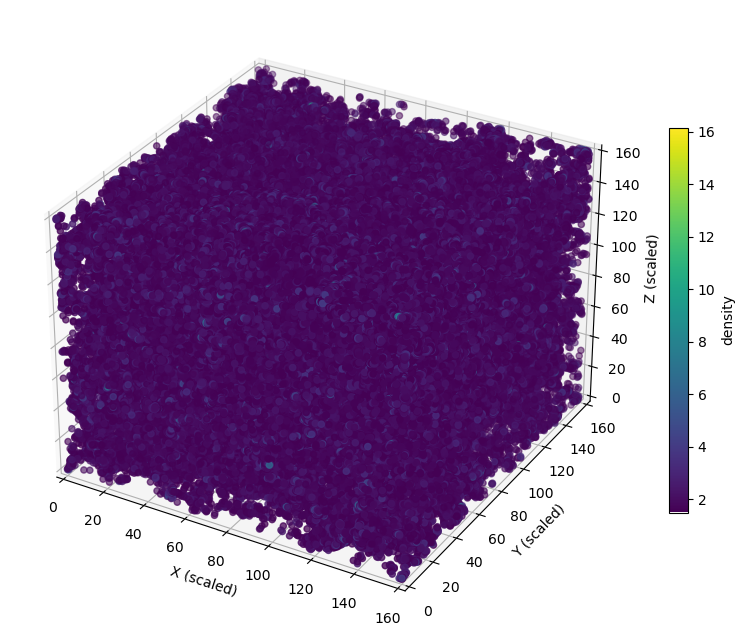

In [135]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


data_cube = coeval.density

umbral = 1.5


mask = data_cube > umbral
data_cube_masked = np.where(mask, data_cube, np.nan)

# Definir los parámetros con nuevos nombres
#HII_DIM_ini = 127  # Dimensión original
HII_DIM_ini = 255 # Dimensión original

BOX_ini = 160  # Nueva dimensión


# Función para escalar índices
#def scale_indices(indices, original_dim, new_dim):
#    return (indices / original_dim) * new_dim


# Función para escalar índices
def scale_indices(indices, HII_DIM_ini, BOX_ini):
    return (indices / HII_DIM_ini) * BOX_ini



# Obtener las coordenadas de los índices que cumplen con la máscara
x_indices, y_indices, z_indices = np.where(mask)

# Escalar las coordenadas
x_scaled = scale_indices(x_indices, HII_DIM_ini, BOX_ini)
y_scaled = scale_indices(y_indices, HII_DIM_ini, BOX_ini)
z_scaled = scale_indices(z_indices, HII_DIM_ini, BOX_ini)

# Plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(x_scaled, y_scaled, z_scaled, c=data_cube_masked[x_indices, y_indices, z_indices], cmap='viridis')
cbar = plt.colorbar(scatter, shrink=0.5)
cbar.set_label('density')

ax.set_xlabel('X (scaled)')
ax.set_ylabel('Y (scaled)')
ax.set_zlabel('Z (scaled)')

ax.set_xlim([0, BOX_ini])
ax.set_ylim([0, BOX_ini])
ax.set_zlim([0, BOX_ini])

plt.rcParams["figure.figsize"] = (10, 10)
plt.show()


# _______________________________________________________________

## Fraccion  de colapso de gas, para mini halos y halos

In [136]:
#coeval.global_params

In [137]:
coeval.Fcoll

array([[[[1.56345442e-02, 1.56347677e-02, 1.56344585e-02, ...,
          1.56306680e-02, 1.56324916e-02, 1.56337712e-02],
         [1.56357996e-02, 1.56360138e-02, 1.56357177e-02, ...,
          1.56319216e-02, 1.56337395e-02, 1.56350452e-02],
         [1.56366006e-02, 1.56368241e-02, 1.56365074e-02, ...,
          1.56327151e-02, 1.56345349e-02, 1.56358406e-02],
         ...,
         [1.56280193e-02, 1.56282578e-02, 1.56279467e-02, ...,
          1.56241506e-02, 1.56259649e-02, 1.56272762e-02],
         [1.56306475e-02, 1.56308711e-02, 1.56305842e-02, ...,
          1.56267732e-02, 1.56286061e-02, 1.56298913e-02],
         [1.56328343e-02, 1.56330541e-02, 1.56327374e-02, ...,
          1.56289563e-02, 1.56307705e-02, 1.56320557e-02]],

        [[1.56493615e-02, 1.56495832e-02, 1.56492684e-02, ...,
          1.56454742e-02, 1.56473238e-02, 1.56485923e-02],
         [1.56506002e-02, 1.56508591e-02, 1.56505443e-02, ...,
          1.56467408e-02, 1.56485848e-02, 1.56498626e-02],
        

In [138]:
coeval.Fcoll_MINI

array([[[[0.02771503, 0.02771614, 0.02771694, ..., 0.02770978,
          0.02771185, 0.0277136 ],
         [0.02771284, 0.02771396, 0.02771481, ..., 0.0277076 ,
          0.02770969, 0.02771142],
         [0.02771053, 0.02771159, 0.02771239, ..., 0.02770524,
          0.0277073 , 0.02770906],
         ...,
         [0.02772009, 0.02772119, 0.02772199, ..., 0.02771483,
          0.02771692, 0.02771867],
         [0.02771865, 0.02771975, 0.02772054, ..., 0.02771339,
          0.02771545, 0.02771721],
         [0.02771696, 0.02771806, 0.02771884, ..., 0.02771171,
          0.02771377, 0.02771554]],

        [[0.02772503, 0.02772611, 0.02772691, ..., 0.02771977,
          0.02772183, 0.02772362],
         [0.02772287, 0.02772398, 0.02772478, ..., 0.0277176 ,
          0.0277197 , 0.02772143],
         [0.02772047, 0.02772161, 0.02772237, ..., 0.02771519,
          0.02771724, 0.02771903],
         ...,
         [0.0277301 , 0.02773122, 0.02773198, ..., 0.02772485,
          0.02772689, 0.0

# Histograma de Fcoll  y Fcoll mini

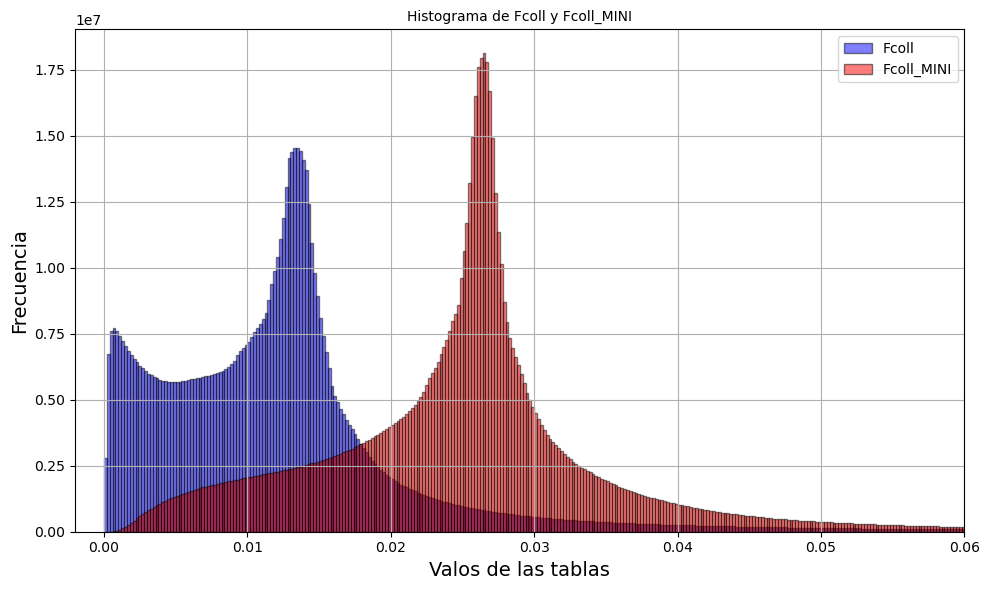

In [139]:
import numpy as np
import matplotlib.pyplot as plt

# Aplanar los datos
fcoll_data = coeval.Fcoll.flatten()
fcoll_mini_data = coeval.Fcoll_MINI.flatten()

# Configuración del gráfico
plt.figure(figsize=(10, 6))

# Histograma para Fcoll
plt.hist(fcoll_data, bins=5000, alpha=0.5, label='Fcoll', color='blue', edgecolor='black')

# Histograma para Fcoll_MINI
plt.hist(fcoll_mini_data, bins=5000, alpha=0.5, label='Fcoll_MINI', color='red', edgecolor='black')

# Configurar etiquetas y título
plt.xlabel('Valos de las tablas', fontsize=14)
plt.xlim(-0.002,0.06)
plt.ylabel('Frecuencia', fontsize=14)
plt.title('Histograma de Fcoll y Fcoll_MINI', fontsize=10)
plt.legend()
plt.grid()

# Mostrar el gráfico
plt.tight_layout()
plt.savefig('histograma_fcoll.png', dpi=300)
plt.show()


# Histograma PARA MINI HALOS

In [140]:
coeval.Fcoll_MINI.shape

(47, 256, 256, 256)

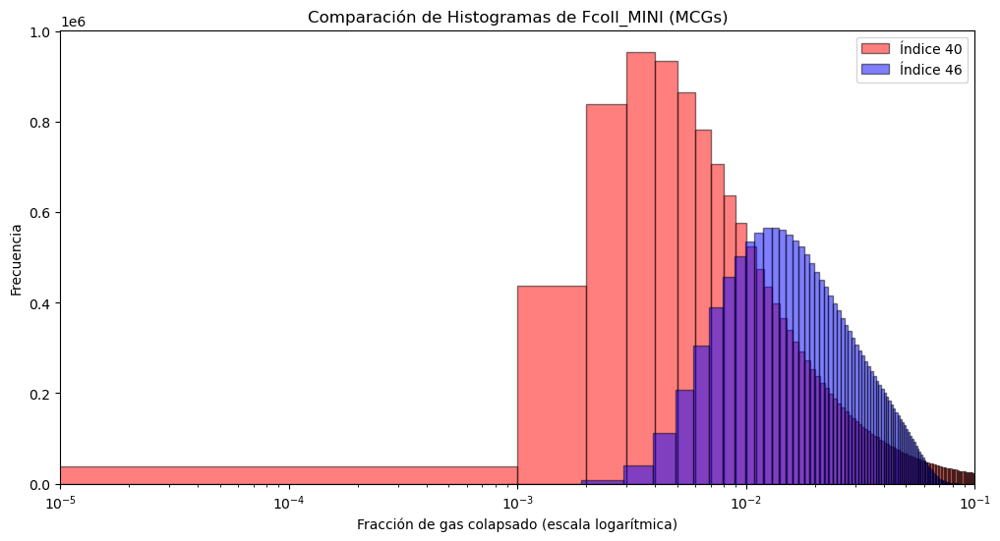

In [241]:
import numpy as np
import matplotlib.pyplot as plt

datos_seleccionados_1 = coeval.Fcoll_MINI[35]
datos_seleccionados_2 = coeval.Fcoll_MINI[46]


datos_1d_1 = datos_seleccionados_1.flatten()
datos_1d_2 = datos_seleccionados_2.flatten()

plt.figure(figsize=(12, 6))

#plt.hist(datos_1d_1, bins=10000, alpha=0.5, label='Índice 30', edgecolor='black', color='blue')

plt.hist(datos_1d_2, bins=1000, alpha=0.5, label='Índice 40', edgecolor='black', color='red')

plt.hist(datos_1d_1, bins=1000, alpha=0.5, label='Índice 46', edgecolor='black', color='blue')


plt.xscale('log')  
plt.xlim(10**-5, 10**0) 

plt.xlabel('Fracción de gas colapsado (escala logarítmica)')
plt.ylabel('Frecuencia')
plt.title('Comparación de Histogramas de Fcoll_MINI (MCGs)')

plt.xlim(10**-5, 10**-1)  

plt.legend() 

plt.show()


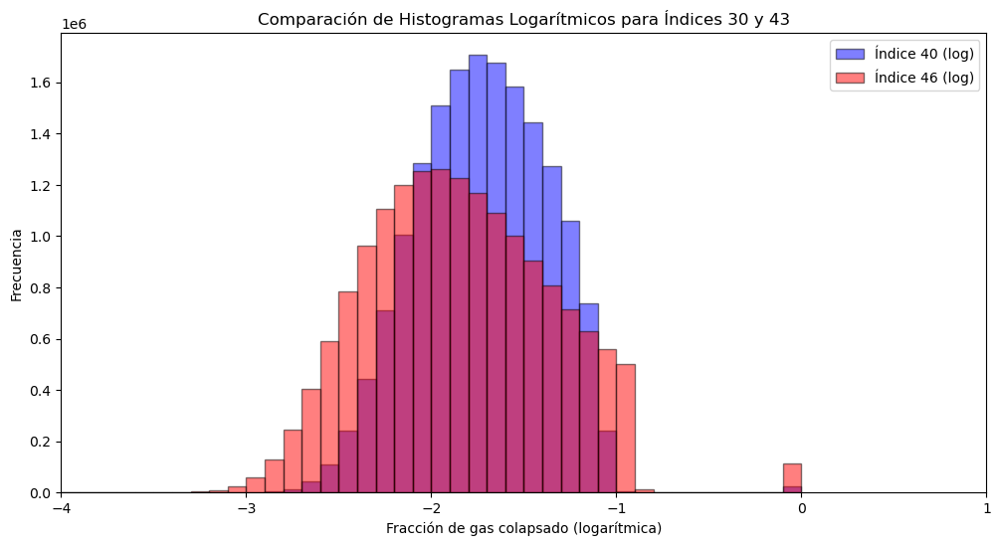

In [250]:
import numpy as np
import matplotlib.pyplot as plt

datos_seleccionados_1 = coeval.Fcoll_MINI[40]
datos_seleccionados_2 = coeval.Fcoll_MINI[46]

e = 1e-10

datos_log_1 = np.log10(datos_seleccionados_1 + e)
datos_log_2 = np.log10(datos_seleccionados_2 + e)

datos_1d_log_1 = datos_log_1.flatten()
datos_1d_log_2 = datos_log_2.flatten()

plt.figure(figsize=(12, 6))

plt.hist(datos_1d_log_1, bins=100, alpha=0.5, label='Índice 40 (log)', edgecolor='black', color='blue')

plt.hist(datos_1d_log_2, bins=100, alpha=0.5, label='Índice 46 (log)', edgecolor='black', color='red')

plt.xscale('linear') 
plt.xlabel('Fracción de gas colapsado (logarítmica)')
plt.ylabel('Frecuencia')
plt.title('Comparación de Histogramas Logarítmicos para Índices 30 y 43')
plt.xlim(-4,1) 

plt.legend() 


plt.show()


# Histograma PARA HALOS

In [143]:
coeval.Fcoll.shape

(47, 256, 256, 256)

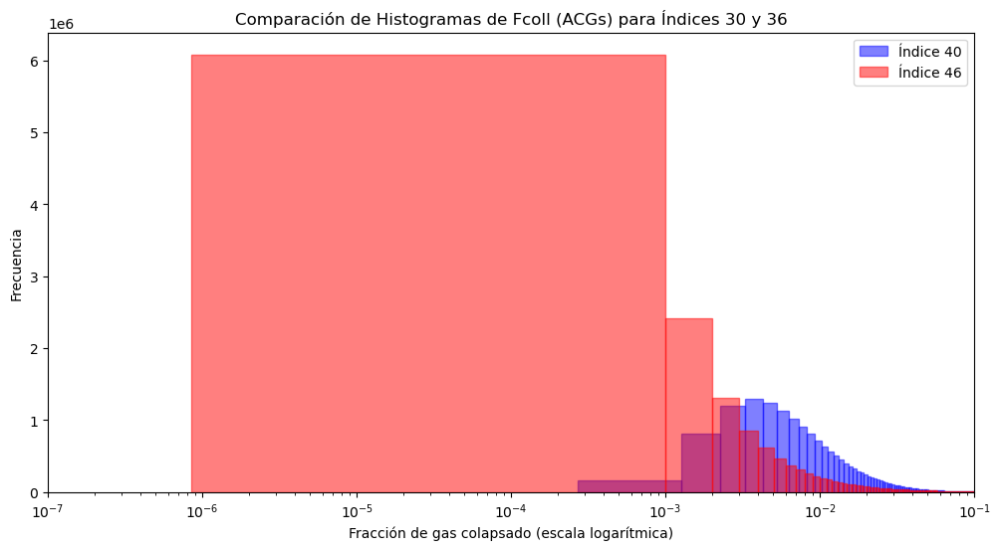

In [252]:
import numpy as np
import matplotlib.pyplot as plt



datos_sel_1 = coeval.Fcoll[30]
datos_sel_2 = coeval.Fcoll[46]

datos_1d_1 = datos_sel_1.flatten()
datos_1d_2 = datos_sel_2.flatten()

plt.figure(figsize=(12, 6))

plt.hist(datos_1d_1, bins=1000, alpha=0.5, label='Índice 40', edgecolor='blue', color='blue')

plt.hist(datos_1d_2, bins=1000, alpha=0.5, label='Índice 46', edgecolor='red', color='red')

plt.xscale('log') 
plt.xlim(10**-7, 10**-1)  


plt.xlabel('Fracción de gas colapsado (escala logarítmica)')
plt.ylabel('Frecuencia')
plt.title('Comparación de Histogramas de Fcoll (ACGs) para Índices 30 y 36')



plt.legend()
plt.show()


# HIST-  PARA MINI HALOS + HALOS
### Dependiente de t,x,y,z

In [253]:
coeval.Fcoll.shape

(47, 256, 256, 256)

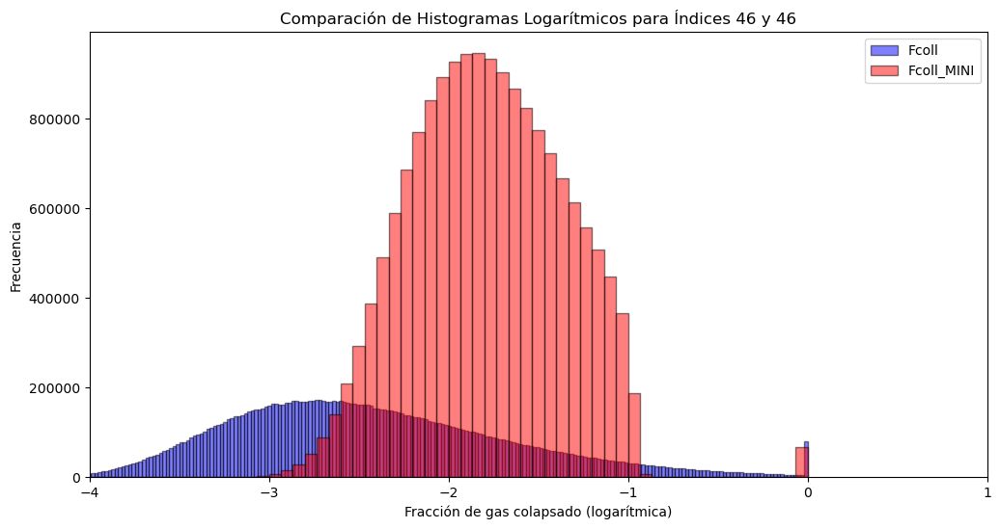

In [254]:
import numpy as np
import matplotlib.pyplot as plt

datos_seleccionados_1 = coeval.Fcoll[44]
datos_seleccionados_2 = coeval.Fcoll_MINI[44]

e = 1e-20

datos_log_1 = np.log10(datos_seleccionados_1 + e )
datos_log_2 = np.log10(datos_seleccionados_2 + e)

datos_1d_log_1 = datos_log_1.flatten()
datos_1d_log_2 = datos_log_2.flatten()

plt.figure(figsize=(12, 6))

plt.hist(datos_1d_log_1, bins=300, alpha=0.5, label='Fcoll', edgecolor='black', color='blue')

plt.hist(datos_1d_log_2, bins=300, alpha=0.5, label='Fcoll_MINI', edgecolor='black', color='red')

plt.xscale('linear') 
plt.xlabel('Fracción de gas colapsado (logarítmica)')
plt.ylabel('Frecuencia')
plt.title('Comparación de Histogramas Logarítmicos para Índices 46 y 46')
plt.xlim(-4,1) 

plt.legend() 

plt.savefig('Histograma de Fcoll y Fcoll MINI.jpg', dpi=300, bbox_inches='tight')

plt.show()


In [255]:
coeval.Fcoll_MINI.mean()

0.02626065

In [256]:
coeval.Fcoll_MINI.max()

1.0

In [257]:
coeval.Fcoll_MINI.min()

0.0

In [258]:
coeval.Fcoll.mean()

0.01630852

In [259]:
coeval.Fcoll.max()

1.0

In [260]:
coeval.Fcoll.min()

5.962445e-07

In [261]:
coeval.density.max()

16.166258

In [262]:
coeval.density.min()

-0.75955707

In [263]:
coeval.density.mean()

-2.0239146e-05

In [264]:
coeval.Fcoll_MINI.flatten()

array([0.02771503, 0.02771614, 0.02771694, ..., 0.00529794, 0.0098813 ,
       0.01277439], dtype=float32)

# Fcoll MINI  3D

In [158]:
coeval.Fcoll_MINI.shape

(47, 256, 256, 256)

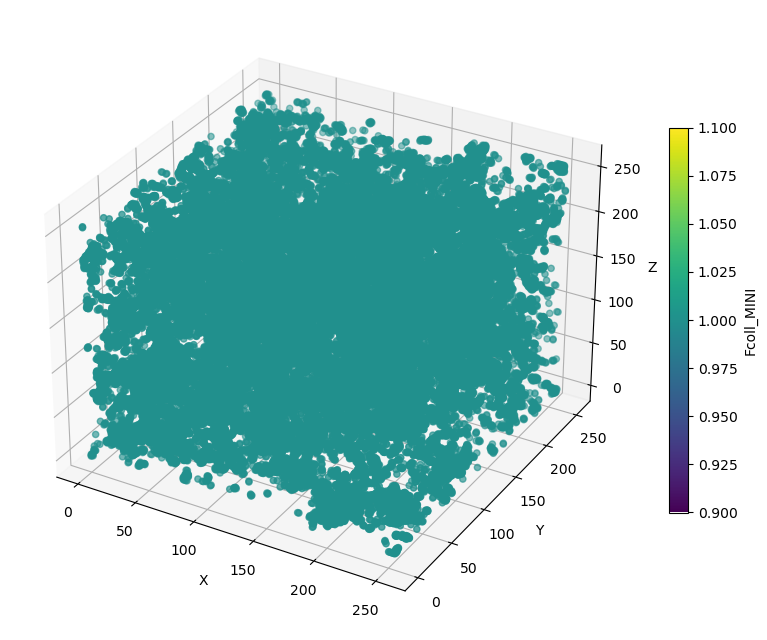

In [159]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fcoll_mini_data = coeval.Fcoll_MINI[46]  

umbral = 0.6

mask = fcoll_mini_data > umbral

fcoll_mini_data_masked = np.where(mask, fcoll_mini_data, np.nan)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x, y, z = np.where(mask)

scatter = ax.scatter(x, y, z, c=fcoll_mini_data_masked[x, y, z], cmap='viridis')

cbar = plt.colorbar(scatter, shrink=0.5)  
cbar.set_label('Fcoll_MINI')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.rcParams["figure.figsize"] = (10, 10)
#plt.savefig('3D Fcoll MINI.jpg', dpi=300, bbox_inches='tight')

plt.show()

## Coordenadas (x,y,z) para Fcoll_MINI 

In [164]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Datos
fcoll_mini_data = coeval.Fcoll_MINI[46]  

umbral = 0.99

mask = fcoll_mini_data > umbral

fcoll_mini_data_masked = np.where(mask, fcoll_mini_data, np.nan)

x, y, z = np.where(mask)

values = fcoll_mini_data[x, y, z]

max_value = np.nanmax(values)
min_value = np.nanmin(values)

max_index = np.nanargmax(values)
max_coord = (x[max_index], y[max_index], z[max_index])

min_index = np.nanargmin(values)
min_coord = (x[min_index], y[min_index], z[min_index])

print(f'Número de mini halos: {len(x)}')
print(f'Valor máximo de Fcoll_MINI: {max_value:.4f}, Coordenada: {max_coord}')
print(f'Valor mínimo de Fcoll_MINI: {min_value:.4f}, Coordenada: {min_coord}')
print('Coordenadas y valores correspondientes:')
for i in range(len(x)):
    coord = (x[i], y[i], z[i])
    value = fcoll_mini_data[x[i], y[i], z[i]]
    print(f'Coordenada: {coord}, Valor de Fcoll_MINI: {value:.4f}')

# Crear gráfico 3D
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
#scatter = ax.scatter(x, y, z, c=fcoll_mini_data_masked[x, y, z], cmap='viridis')
#cbar = plt.colorbar(scatter, shrink=0.5)  
#cbar.set_label('Fcoll_MINI')

#ax.set_xlabel('X')
#ax.set_ylabel('Y')
#ax.set_zlabel('Z')
#plt.rcParams["figure.figsize"] = (10, 10)
#plt.show()


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



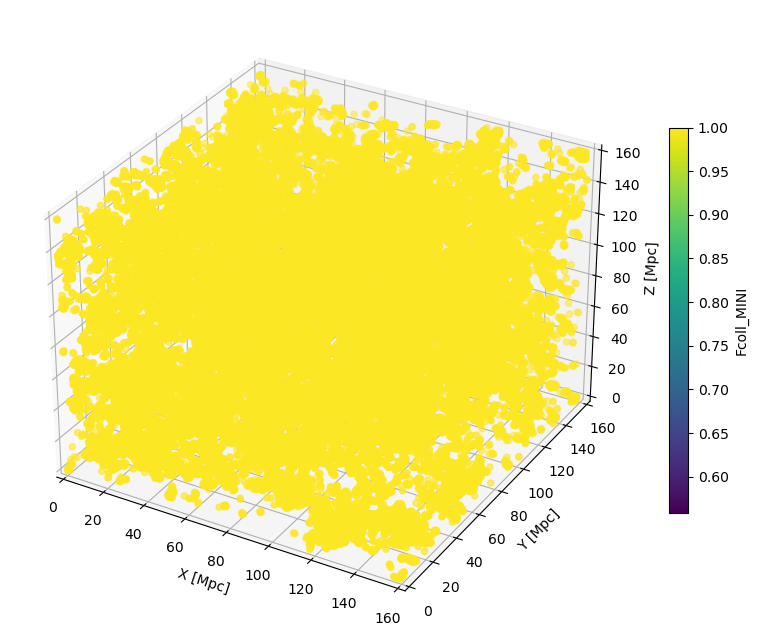

In [165]:
# CAMBIO DE COORDENADAS de 120 a 160 Mpc
# CAMBIO DE COORDENADAS de 456 a 160 Mpc

# Para MINI HALOS


import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Datos
data = coeval.Fcoll_MINI[46]  

#  umbral
threshold = 0.5

mask = data > threshold
masked_data = np.where(mask, data, np.nan)

original_dim = data.shape[0]  # Dimensiones originales
new_dim = 160                 # Nueva dimensión

def rescale_indices(indices, orig_dim, new_dim):
    return (indices / orig_dim) * new_dim

x_coords, y_coords, z_coords = np.where(mask)

x_rescaled = rescale_indices(x_coords, original_dim, new_dim)
y_rescaled = rescale_indices(y_coords, original_dim, new_dim)
z_rescaled = rescale_indices(z_coords, original_dim, new_dim)


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter_plot = ax.scatter(x_rescaled, y_rescaled, z_rescaled, c=masked_data[x_coords, y_coords, z_coords], cmap='viridis')
colorbar = plt.colorbar(scatter_plot, shrink=0.5)
colorbar.set_label('Fcoll_MINI')

ax.set_xlabel('X [Mpc]')
ax.set_ylabel('Y [Mpc]')
ax.set_zlabel('Z [Mpc]')

ax.set_xlim([0, new_dim])
ax.set_ylim([0, new_dim])
ax.set_zlim([0, new_dim])

plt.rcParams["figure.figsize"] = (10, 10)


plt.savefig('3D Fcoll MINI.jpg', dpi=300, bbox_inches='tight')
plt.show()

# Fcoll  3D

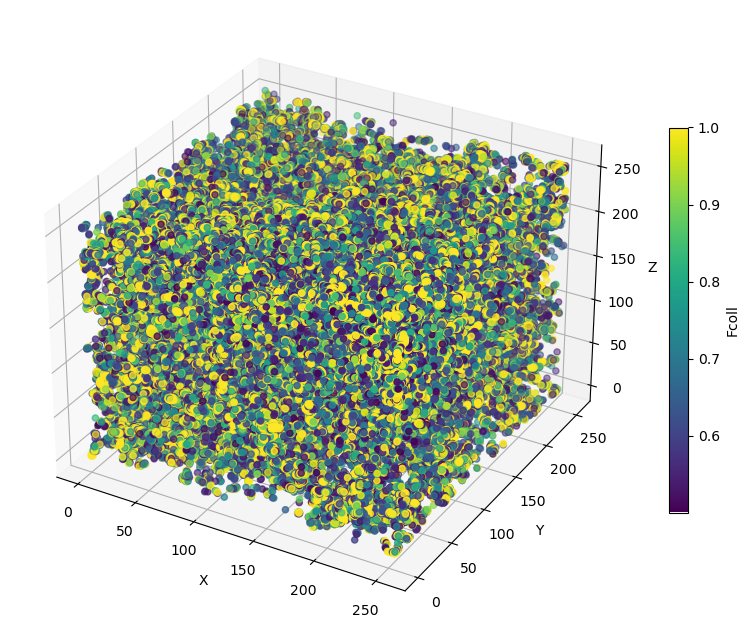

In [166]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fcoll_data = coeval.Fcoll[46]  

# Definir umbral

umbral = 0.5

mask = fcoll_data > umbral

fcoll_data_masked = np.where(mask, fcoll_data, np.nan)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x, y, z = np.where(mask)

scatter = ax.scatter(x, y, z, c=fcoll_data_masked[x, y, z], cmap='viridis')

cbar = plt.colorbar(scatter, shrink=0.5)  
cbar.set_label('Fcoll')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.rcParams["figure.figsize"] = (10, 10)
plt.show()


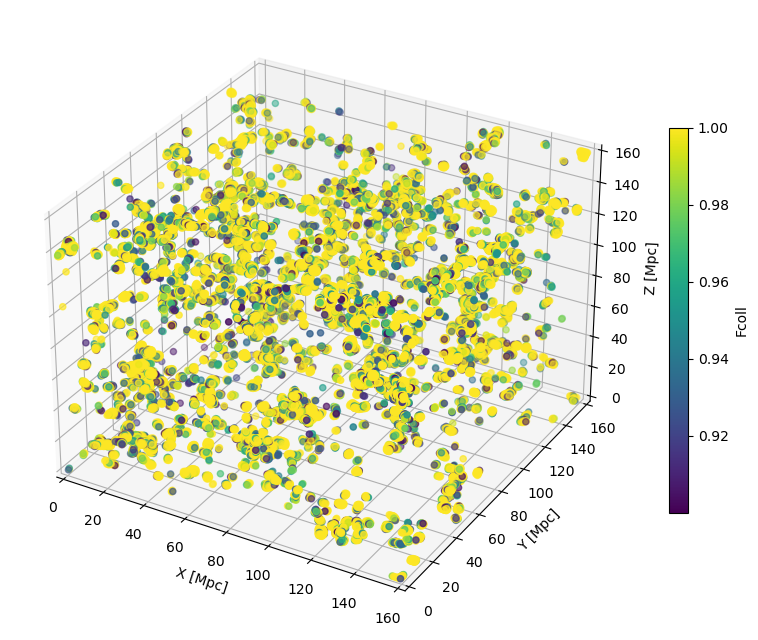

In [167]:
# CAMBIO DE COORDENADAS, de 255 a 160 Mpc

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fcoll_data = coeval.Fcoll[40]  

# Definir umbral
umbral = 0.9

mask = fcoll_data > umbral
fcoll_data_masked = np.where(mask, fcoll_data, np.nan)

# Definir los parámetros con nuevos nombres
HII_DIM_ini = fcoll_data.shape[0]  # Dimensiones originales
BOX_ini = 160  # Nueva dimensión

# Función para escalar índices
def scale_indices(indices, original_dim, new_dim):
    return (indices / original_dim) * new_dim

# Obtener las coordenadas de los índices que cumplen con la máscara
x_indices, y_indices, z_indices = np.where(mask)

# Escalar las coordenadas
x_scaled = scale_indices(x_indices, HII_DIM_ini, BOX_ini)
y_scaled = scale_indices(y_indices, HII_DIM_ini, BOX_ini)
z_scaled = scale_indices(z_indices, HII_DIM_ini, BOX_ini)

# Plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(x_scaled, y_scaled, z_scaled, c=fcoll_data_masked[x_indices, y_indices, z_indices], cmap='viridis')
cbar = plt.colorbar(scatter, shrink=0.5)
cbar.set_label('Fcoll')

ax.set_xlabel('X [Mpc] ')
ax.set_ylabel('Y [Mpc]')
ax.set_zlabel('Z [Mpc]')

# Ajustar límites de los ejes
ax.set_xlim([0, BOX_ini])
ax.set_ylim([0, BOX_ini])
ax.set_zlim([0, BOX_ini])

plt.rcParams["figure.figsize"] = (10, 10)

plt.savefig('3D Fcoll.jpg', dpi=300, bbox_inches='tight')
plt.show()

## Coordenadas (x,y,z) para Fcoll

In [213]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fcoll_data = coeval.Fcoll[46]  

# Definir umbral
umbral = 0.9

mask = fcoll_data > umbral

fcoll_data_masked = np.where(mask, fcoll_data, np.nan)

x, y, z = np.where(mask)

values = fcoll_data[x, y, z]

if values.size > 0:
    
    max_value = np.nanmax(values)
    min_value = np.nanmin(values)

    
    max_index = np.nanargmax(values)
    max_coord = (x[max_index], y[max_index], z[max_index])

    
    min_index = np.nanargmin(values)
    min_coord = (x[min_index], y[min_index], z[min_index])

    
    print(f'Número de "halos": {len(x)}')
    print(f'Valor máximo de Fcoll: {max_value:.4f}, Coordenada: {max_coord}')
    print(f'Valor mínimo de Fcoll: {min_value:.4f}, Coordenada: {min_coord}')
    print('Coordenadas y valores correspondientes:')
    for i in range(len(x)):
        coord = (x[i], y[i], z[i])
        value = fcoll_data[x[i], y[i], z[i]]
        print(f'Coordenada: {coord}, Valor de Fcoll: {value:.4f}')
#else:
#    print('No hay valores que cumplan con el umbral.')

# Crear gráfico 3D
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
#scatter = ax.scatter(x, y, z, c=fcoll_data_masked[x, y, z], cmap='viridis')
#cbar = plt.colorbar(scatter, shrink=0.5)  
#cbar.set_label('Fcoll')

#ax.set_xlabel('X')
#ax.set_ylabel('Y')
#ax.set_zlabel('Z')
#plt.rcParams["figure.figsize"] = (10, 10)
#plt.show()


Número de "halos": 1425
Valor máximo de Fcoll: 1.0000, Coordenada: (0, 106, 108)
Valor mínimo de Fcoll: 0.9001, Coordenada: (34, 179, 136)
Coordenadas y valores correspondientes:
Coordenada: (0, 106, 108), Valor de Fcoll: 1.0000
Coordenada: (0, 106, 109), Valor de Fcoll: 1.0000
Coordenada: (0, 239, 166), Valor de Fcoll: 1.0000
Coordenada: (1, 106, 109), Valor de Fcoll: 1.0000
Coordenada: (2, 41, 113), Valor de Fcoll: 1.0000
Coordenada: (2, 41, 114), Valor de Fcoll: 1.0000
Coordenada: (4, 30, 202), Valor de Fcoll: 1.0000
Coordenada: (4, 90, 147), Valor de Fcoll: 1.0000
Coordenada: (4, 90, 148), Valor de Fcoll: 1.0000
Coordenada: (4, 156, 33), Valor de Fcoll: 1.0000
Coordenada: (4, 237, 166), Valor de Fcoll: 1.0000
Coordenada: (5, 30, 202), Valor de Fcoll: 1.0000
Coordenada: (7, 237, 224), Valor de Fcoll: 1.0000
Coordenada: (7, 250, 176), Valor de Fcoll: 1.0000
Coordenada: (8, 53, 231), Valor de Fcoll: 1.0000
Coordenada: (8, 53, 232), Valor de Fcoll: 1.0000
Coordenada: (8, 63, 235), Valo

# PLOT 3D de los Fcoll mini y Fcoll

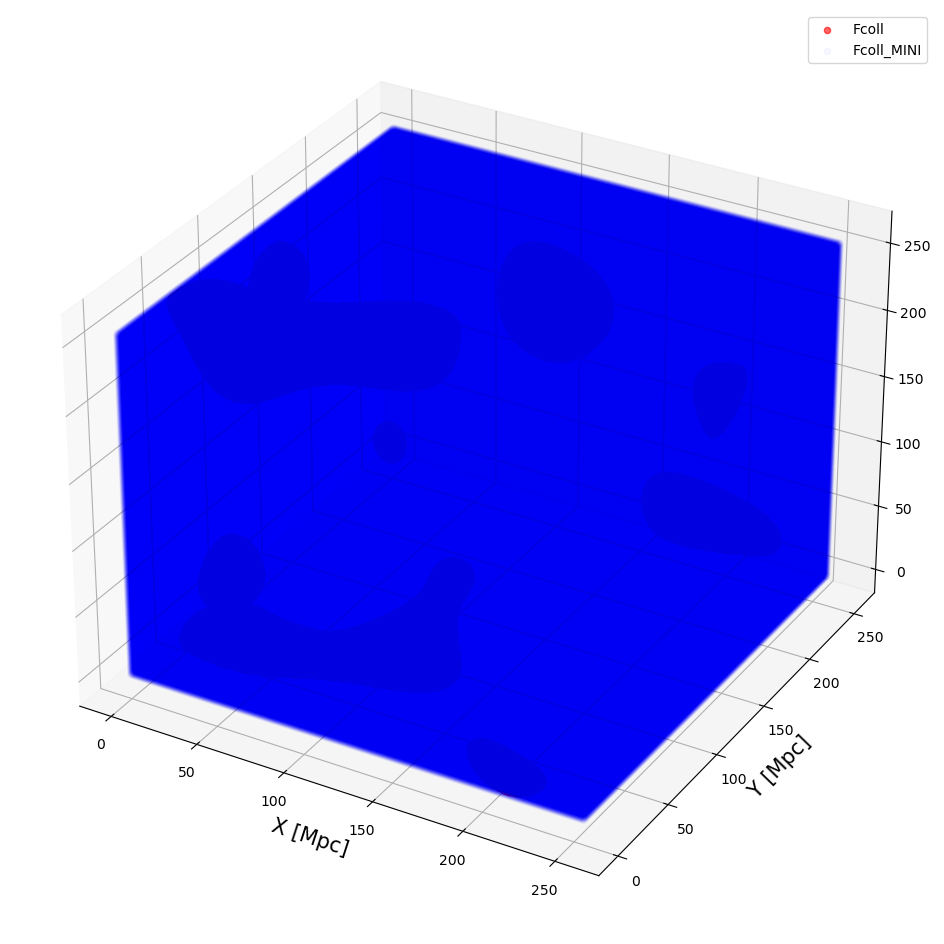

In [228]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

W=10

fcoll_data = coeval.Fcoll[W]  
fcoll_mini_data = coeval.Fcoll_MINI[W]  

umbral = 0.02

mask_fcoll = fcoll_data > umbral
mask_fcoll_mini = fcoll_mini_data > umbral

fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)
fcoll_mini_data_masked = np.where(mask_fcoll_mini, fcoll_mini_data, np.nan)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

#  Fcoll 
x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
scatter_fcoll = ax.scatter(x_fcoll, y_fcoll, z_fcoll, c='red', label='Fcoll', alpha=0.6)

#  Fcoll_MINI 
x_fcoll_mini, y_fcoll_mini, z_fcoll_mini = np.where(mask_fcoll_mini)
scatter_fcoll_mini = ax.scatter(x_fcoll_mini, y_fcoll_mini, z_fcoll_mini, c='blue', label='Fcoll_MINI', alpha=0.03)

#  Fcoll 
#x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
#scatter_fcoll = ax.scatter(x_fcoll, y_fcoll, z_fcoll, c='red', label='Fcoll', alpha=0.6)


plt.xlabel('X [Mpc]', fontsize=15)
plt.ylabel('Y [Mpc]', fontsize=15)
plt.legend(loc='upper right', fontsize=10) 

#ax.set_xlabel('X [Mpc] ')
#ax.set_ylabel('Y [Mpc]')
#ax.set_zlabel('Z [Mpc]')

ax.legend(loc='best')

plt.rcParams["figure.figsize"] = (12, 12)
plt.savefig('3D BOX fcoll- fcollmini.jpg', dpi=300, bbox_inches='tight')

plt.show()


Número de halos (Fcoll) en el rango de z (0, 1): 1348
Número de mini halos (Fcoll_MINI) en el rango de z (0, 1): 1126


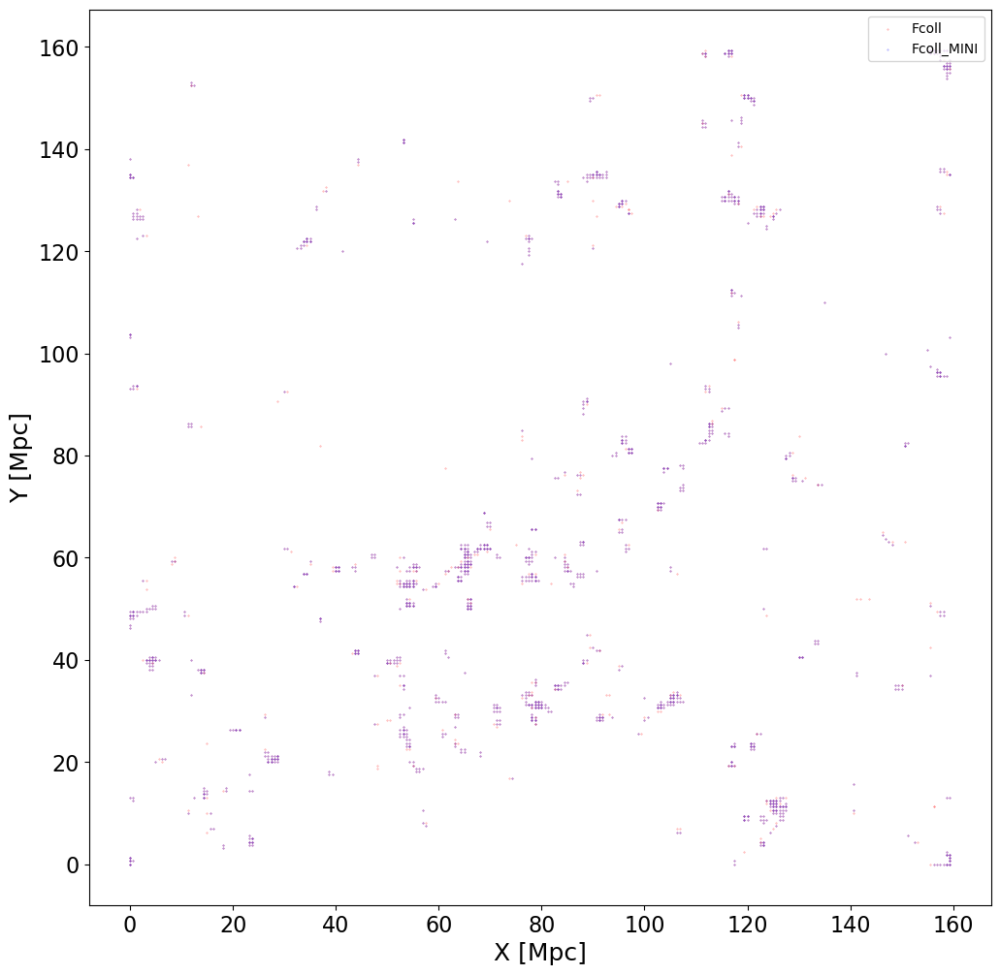

In [229]:
import numpy as np
import matplotlib.pyplot as plt

# datos de entrada, aca use las tablas... 
W = 46
fcoll_data = coeval.Fcoll[W]
fcoll_mini_data = coeval.Fcoll_MINI[W]

#  umbral
umbral = 0.9


#  máscaras
mask_fcoll = fcoll_data > umbral
mask_fcoll_mini = fcoll_mini_data > umbral

fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)
fcoll_mini_data_masked = np.where(mask_fcoll_mini, fcoll_mini_data, np.nan)

# las coordenadas
original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
new_dim = 160  # la del box

def scale_indices(indices, orig_dim, new_dim):
    return (indices / orig_dim) * new_dim

x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
x_fcoll_mini, y_fcoll_mini, z_fcoll_mini = np.where(mask_fcoll_mini)

x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

x_fcoll_mini_scaled = scale_indices(x_fcoll_mini, original_dim, new_dim)
y_fcoll_mini_scaled = scale_indices(y_fcoll_mini, original_dim, new_dim)
z_fcoll_mini_scaled = scale_indices(z_fcoll_mini, original_dim, new_dim)

#:::::::::::::REBANADA :::::::::::::

# rango z para la rebanada
zmin, zmax = 0, 1

# rebanada en el rango z
mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
mask_z_slice_fcoll_mini = (z_fcoll_mini_scaled >= zmin) & (z_fcoll_mini_scaled <= zmax)

x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

x_fcoll_mini_slice = x_fcoll_mini_scaled[mask_z_slice_fcoll_mini]
y_fcoll_mini_slice = y_fcoll_mini_scaled[mask_z_slice_fcoll_mini]

num_halos_fcoll = np.sum(mask_z_slice_fcoll)
num_halos_fcoll_mini = np.sum(mask_z_slice_fcoll_mini)

print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')
print(f'Número de mini halos (Fcoll_MINI) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll_mini}')



#  rebanada 2D
fig, ax = plt.subplots()

#  Fcoll
ax.scatter(x_fcoll_slice, y_fcoll_slice, c='red', label='Fcoll', alpha=0.5,s=0.1)

#  Fcoll_MINI
ax.scatter(x_fcoll_mini_slice, y_fcoll_mini_slice, c='blue', label='Fcoll_MINI', alpha=0.5,s=0.1)

#  Fcoll
#ax.scatter(x_fcoll_slice, y_fcoll_slice, c='red', label='Fcoll', alpha=0.6,s=20)



plt.xlabel('X [Mpc]', fontsize=18)
plt.ylabel('Y [Mpc]', fontsize=18)
plt.legend(loc='upper right', fontsize=10) 
plt.tick_params(axis='both', labelsize=16)  


#ax.set_xlabel('X [Mpc]')
#ax.set_ylabel('Y [Mpc]')
#ax.legend(loc='best')
plt.savefig('Halos_Fcoll_and_Fcoll_MINI en 2D.jpg', dpi=300, bbox_inches='tight')

plt.show()

In [171]:
#coeval.init_struct.write

# ______________________________________________________________

In [172]:
# Uso los colores del  21cmFAST    EoR colour
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

EoR_colour = mcolors.LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, 'white'), (0.33, 'yellow'), (0.5, 'orange'), (0.68, 'red'),
     (0.83333, 'black'), (0.9, 'blue'), (1, 'cyan')]
)

# Utilizar el colormap directamente en una visualización
#plt.imshow([[0, 1], [1, 0]], cmap=EoR_colour)
#plt.colorbar()
#plt.show()


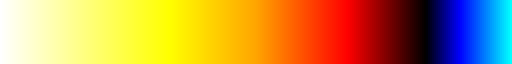

In [173]:
EoR_colour 

# _____________________________________________________________

## ● Trabajamos en rebanadas

Ambos códigos tienen como objetivo visualizar datos en 2D a partir de coordenadas 3D, pero cada uno lo hace de manera diferente y para propósitos distintos. A continuación, te explico las diferencias clave entre ellos:

### 1. **Filtrado de Datos en el Eje Z**

- **Primer Código:**
  - Filtra las coordenadas dentro de un rango específico de `z` (`z_min` a `z_max`).
  - **Rango de Z:** El filtrado se realiza usando un rango fijo en el eje `z` y se visualiza toda la información en ese rango.
  - **Uso:** Este enfoque es útil cuando deseas ver cómo se distribuyen los datos en el espacio 2D para un rango específico en el eje `z`.

- **Segundo Código:**
  - Filtra las coordenadas para una "rebanada" de `z` usando un índice de `z` (`z_index`) y un espesor (`delta_z`).
  - **Rebanada en el Eje Z:** El filtrado se realiza usando una máscara que selecciona todos los puntos dentro de una cierta distancia (espesor) alrededor de un índice central de `z`.
  - **Uso:** Este enfoque es útil para visualizar un plano específico en el eje `z` con un espesor determinado, lo que permite analizar una sección transversal del espacio.

### 2. **Definición de Parámetros de Filtrado**

- **Primer Código:**
  - **Parámetros de Filtrado:** `z_min` y `z_max` definen los límites inferior y superior del rango de `z` para la visualización.
  - **Efecto:** Muestra una visualización de los datos que caen dentro de ese rango específico de `z`.

- **Segundo Código:**
  - **Parámetros de Filtrado:** `z_index` y `delta_z` definen el índice del plano central y el espesor de la rebanada.
  - **Efecto:** Muestra una visualización de los datos en una rebanada del espacio alrededor del índice `z` con un espesor especificado.

### 3. **Configuración del Gráfico**

- **Primer Código:**
  - **Gráfico 2D:** El gráfico es una visualización 2D de los datos filtrados en el rango de `z`, con etiquetas y título que reflejan ese rango.
  - **Configuración:** El gráfico utiliza una sola visualización sin configuraciones avanzadas para la visualización de la rebanada.

- **Segundo Código:**
  - **Gráfico 2D:** El gráfico es una visualización 2D de los datos filtrados en una rebanada del espacio z.
  - **Configuración:** Incluye configuraciones adicionales como `plt.xlim` y `plt.ylim` para ajustar los límites del gráfico, y `plt.grid(True)` para mejorar la legibilidad del gráfico.


### **POr lo tanto tenemos...**
- **Primer Código:** Focaliza en un rango específico en `z` para visualizar cómo se distribuyen los puntos en ese rango.
- **Segundo Código:** Focaliza en una rebanada en torno a un índice `z` con un espesor determinado, proporcionando una visión más detallada de una sección del espacio.


## CODIGO 1

## Visualizacon de los datos en 2D (C1)

## HALOS

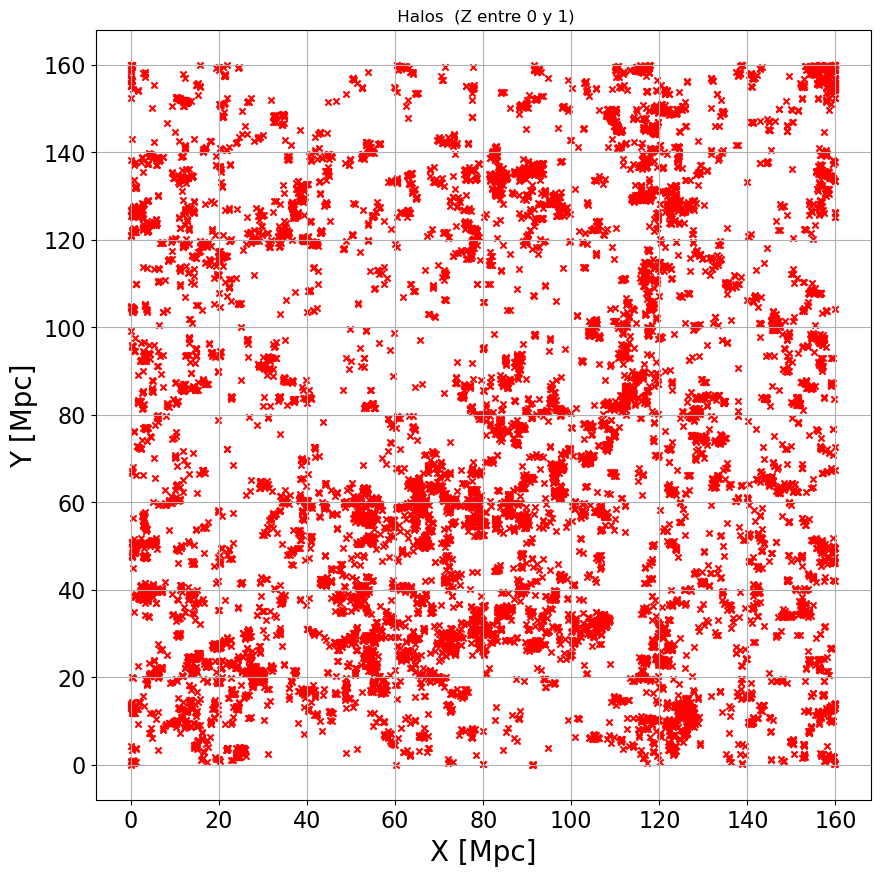

In [232]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()
#DIM = 511
DIM = 1023


#DIM_1 = 255


# Parámetros de la simulación
#BOX_LEN = coeval.user_params.BOX_LEN  # Mpc
#DIM = coeval.user_params.DIM
#DIM = 255

indices_x = x_1
indices_y = y_2
indices_z = z_3

# Convertir los índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN/ DIM)*index
    #return (index / DIM) * BOX_LEN

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    #print("Posiciones 3D en Mpc:")
    #print(positions_3d_mpc)

    # Definir el rango para la rebanada en el eje z
    zmin =0 # como mximo 150
    zmax = 1 # como maximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Graficar los datos filtrados en 2D
    plt.figure(figsize=(10, 10))
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='r', marker='x', s=20)
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.tick_params(axis='both', labelsize=16)  

    
    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
    plt.title(f' Halos  (Z entre {zmin} y {zmax})')
    plt.grid(True)
    plt.show()

#else:
    #print("Los arrays de índices no tienen la misma longitud. No se puede combinar en una matriz 3D.")


## <span style="color: red;">OPCIONAL</span> 

## CODIGO 2

## Visualizacon de los datos en 2D (C2)

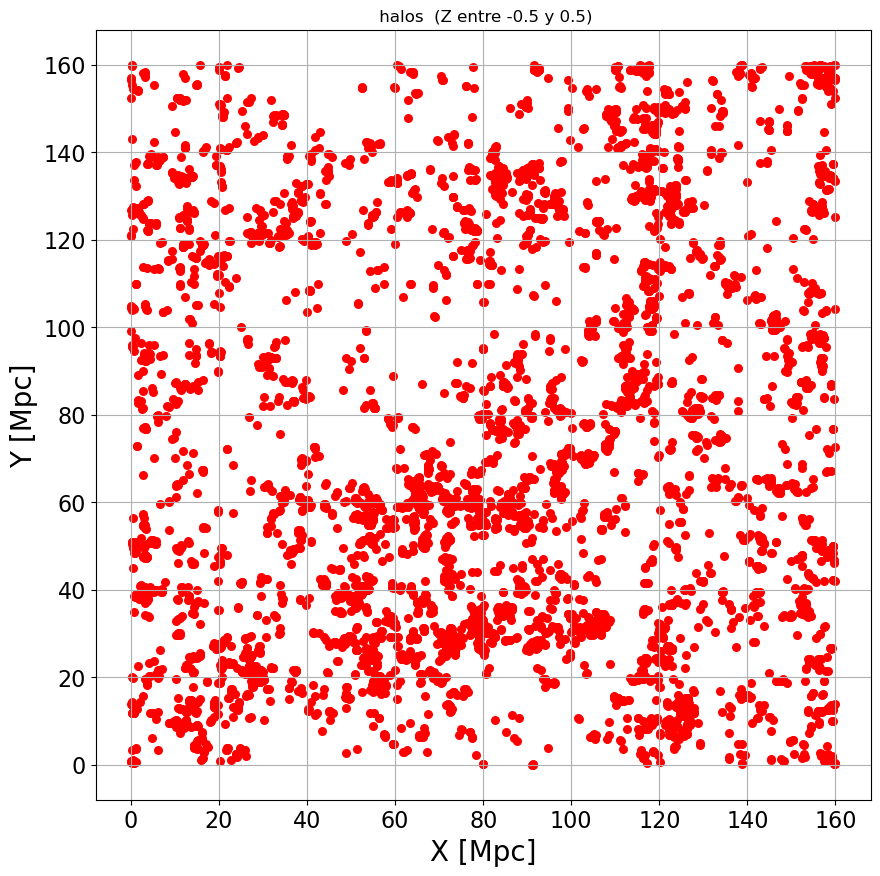

In [233]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Mpc
#DIM = coeval.user_params.DIM
#DIM = halos.halo_coords.max()


#DIM=511
DIM = 1023


indices_x = x_1
indices_y = y_2
indices_z = z_3

# Convertir los índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN/ DIM)*index

#    return (index / DIM) * BOX_LEN

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

# Comprobar que los arrays de índices tengan la misma longitud

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    #print("Posiciones 3D en Mpc:")
    #print(positions_3d_mpc)

    # Parámetros para la rebanada en el eje Z
    z_index = 0 # Índice del plano en el eje z (va de 0 a 150 Mpc)
    delta_z = 1 # Espesor de la rebanada

    # Definir el rango para la rebanada en el eje z
    z_range = (z_index - delta_z / 2, z_index + delta_z / 2)
    
    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= z_range[0]) & (positions_z_mpc <= z_range[1])
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Graficar los datos filtrados en 2D
    plt.figure(figsize=(10, 10))
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='r', marker='o', s=30)
   
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.tick_params(axis='both', labelsize=16)  

    
    #plt.xlabel('X (Mpc)')
    #plt.ylabel('Y (Mpc)')
    plt.title(f' halos  (Z entre {z_range[0]} y {z_range[1]})')
    plt.grid(True)
    plt.show()

#else:
#    print("Los arrays de índices no tienen la misma longitud. No se puede combinar en una matriz 3D.")


#  _________________________________________________________________

# PARTE IV



# i) Densidad ($\delta$) +HALOS

## Todos los datos proyectados en (x,y) + las coordenadas de los halos

## Datos en rebanadas para la densidad


In [176]:
# Esta parte dle codigo esta bien

<Figure size 1000x1000 with 0 Axes>

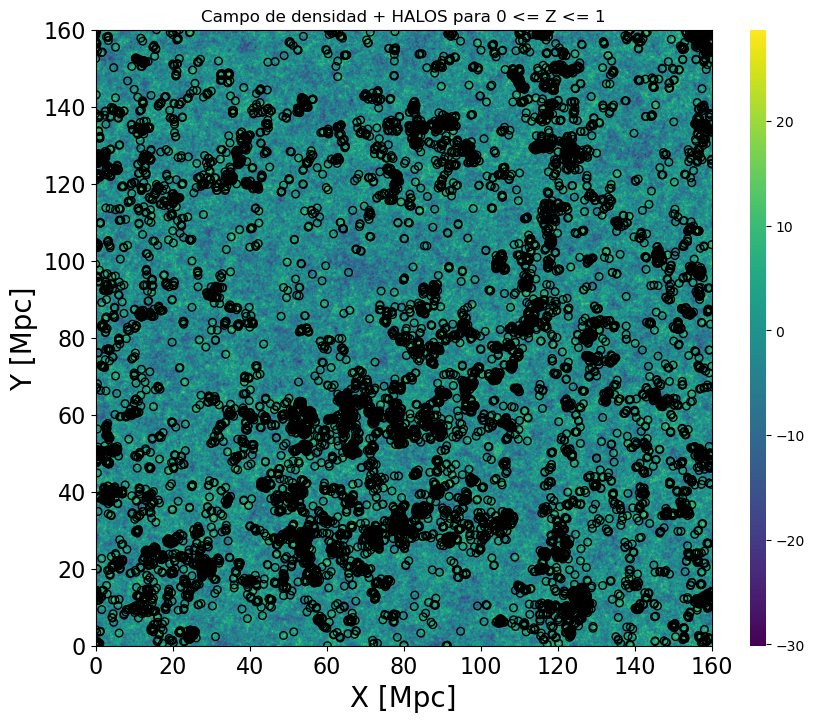

In [177]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
#BOX_LEN = coeval.user_params.BOX_LEN  # Mpc
#DIM = 255

BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()
#DIM = 511
DIM = 1023

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0 # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Graficar la rebanada con la función coeval_sliceplot
    plt.figure(figsize=(10, 10))
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
    
    #plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=5)
    plt.title(f'Campo de densidad + HALOS para {zmin} <= Z <= {zmax}')
    #plt.grid(True)
    
    
    #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=30, label='Halos')
    plt.scatter(
    filtered_positions_x_mpc, filtered_positions_y_mpc,
    facecolor='none',         # Interior transparente
    edgecolor='0',            # Color del borde
    linewidths=1,           # Grosor del borde
    marker='o',               # Forma del marcador
    s=30,                     # Tamaño del círculo
    label='Halos'
)
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.tick_params(axis='both', labelsize=16)  

    #plt.legend()
    plt.savefig('hires_densityCONmini+HALOS.jpg', dpi=300, bbox_inches='tight')
    plt.show()

# Plot: campo de densidad+halos+Fcoll+FcollMINI

Número de halos (Fcoll) en el rango de z (0, 1): 9435
Número de mini halos (Fcoll_MINI) en el rango de z (0, 1): 9762


<Figure size 1000x1000 with 0 Axes>

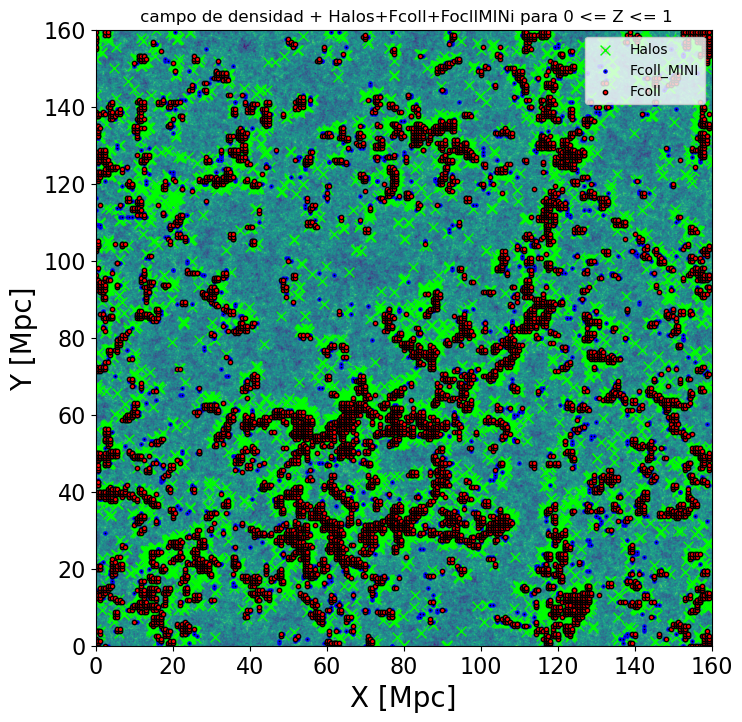

In [225]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()  # Dimensión original (128)
#DIM = 511
DIM = 1023



# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]
# -------------------------------------------------------------------------------------------------
    # Datos de Fcoll y Fcoll_MINI
    W = 46
    fcoll_data = coeval.Fcoll[W]
    fcoll_mini_data = coeval.Fcoll_MINI[W]
# -----------------------------------------------------------------------------
    # Umbral
    umbral = 0.08

    # Máscaras para Fcoll y Fcoll_MINI
    mask_fcoll = fcoll_data > umbral
    mask_fcoll_mini = fcoll_mini_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)
    fcoll_mini_data_masked = np.where(mask_fcoll_mini, fcoll_mini_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_mini, y_fcoll_mini, z_fcoll_mini = np.where(mask_fcoll_mini)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    x_fcoll_mini_scaled = scale_indices(x_fcoll_mini, original_dim, new_dim)
    y_fcoll_mini_scaled = scale_indices(y_fcoll_mini, original_dim, new_dim)
    z_fcoll_mini_scaled = scale_indices(z_fcoll_mini, original_dim, new_dim)

    
    
    
    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    mask_z_slice_fcoll_mini = (z_fcoll_mini_scaled >= zmin) & (z_fcoll_mini_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    x_fcoll_mini_slice = x_fcoll_mini_scaled[mask_z_slice_fcoll_mini]
    y_fcoll_mini_slice = y_fcoll_mini_scaled[mask_z_slice_fcoll_mini]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    num_halos_fcoll_mini = np.sum(mask_z_slice_fcoll_mini)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')
    print(f'Número de mini halos (Fcoll_MINI) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll_mini}')

    
    
    
    
    plt.figure(figsize=(10, 10))

    
         
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=1, cbar=None, ax=ax)
    
   # plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=1)
    plt.title(f' campo de densidad + Halos+Fcoll+FocllMINi para {zmin} <= Z <= {zmax}')

    #halos
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='white', marker='o', s=80, label='Halos')

    # Fcoll y Fcoll_MINI en la rebanada
    #plt.scatter(x_fcoll_slice, y_fcoll_slice, c='red', label='Fcoll', alpha=0.6, s=50)
    #plt.scatter(x_fcoll_mini_slice, y_fcoll_mini_slice, c='blue', label='Fcoll_MINI', alpha=0.6, s=50)
    
    
    
    
  #  #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=100, label='Halos')
  #  plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
  #          facecolor='lime', edgecolor='0', s=50, label='Halos', linewidth=1 )

       
    
# Añadir puntos de Fcoll y Fcoll_MINI en la rebanada
   # plt.scatter(
   #     x_fcoll_slice, y_fcoll_slice,
   #     c='r',               # Color del punto
   #     edgecolor='black',     # Color del borde
   #     linewidths=1,          # Grosor del borde
   #     label='Fcoll',
   #     alpha=1,
   #     s=10
   # )
# --------------------------------------------------------------------------------------------------    
    # Fcoll_MINI    MINI HALOS
#    plt.scatter(
#        x_fcoll_mini_slice, y_fcoll_mini_slice,
#        c='0',              
#        edgecolor='blue',     
#        linewidths=0.1,          
#        label='Fcoll_MINI',
#        alpha=1,
#        s=5
#    ),

# --------------------------------------------------------------------------------------------------

   # HALOS

    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
            facecolor='lime', s=50, label='Halos', 
            linewidth=1, marker='x', color='lime') 



  
 
    # Fcoll_MINI    MINI HALOS
    plt.scatter(
        x_fcoll_mini_slice, y_fcoll_mini_slice,
        c='0',              
        edgecolor='blue',     
        linewidths=1,          
        label='Fcoll_MINI',
        alpha=1,
        s=5
    ),


    # Fcoll HALOS
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='r',               # Color del punto
        edgecolor='black',     # Color del borde
        linewidths=1,          # Grosor del borde
        label='Fcoll',
        alpha=1,
        s=10
    ),


    
      #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=100, label='Halos')
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', edgecolor='0', s=50, label='Halos', linewidth=1 )


    # HALOS

#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', s=50, label='Halos', 
#            linewidth=1, marker='x', color='lime')  

    
# --------------------------------------------------------------------------------------------------------    
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10)
    plt.tick_params(axis='both', labelsize=16)  

#    plt.xlabel('X [Mpc]')
#    plt.ylabel('Y [Mpc]')
#    plt.legend(loc='upper right')

#    plt.legend()
    plt.savefig('hires_density_with_Halos_Fcoll_and_Fcoll_MINI.jpg', dpi=300, bbox_inches='tight')
 #   plt.savefig('hires_density_with_Halos_Fcoll.jpg', dpi=300, bbox_inches='tight')

    plt.show()


# OPCIONAL 
# ______________________________________________________

# SIN MINI HALOS

Número de halos (Fcoll) en el rango de z (0, 1): 1348


<Figure size 1000x1000 with 0 Axes>

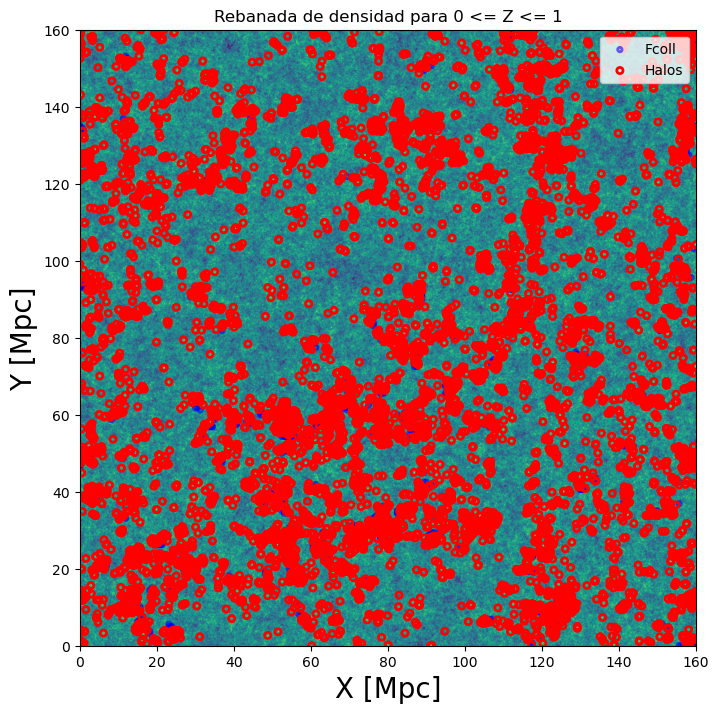

In [192]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()  # Dimensión original (128)

#DIM = 511
DIM = 1023



# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll
    W = 46
    fcoll_data = coeval.Fcoll[W]

    # Umbral
    umbral = 0.9

    # Máscara para Fcoll
    mask_fcoll = fcoll_data > umbral
    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    #  máscara para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')

    plt.figure(figsize=(10, 10))

    #   rebanada de densidad
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=1, cbar=None, ax=ax)
    
    plt.title(f'Rebanada de densidad para {zmin} <= Z <= {zmax}')

    # Mostrar halos con círculos transparentes y borde rojo
    #plt.scatter(
    #    filtered_positions_x_mpc, filtered_positions_y_mpc,
    #    facecolor='none',          # Interior transparente
    #    edgecolor='red',           # Color del borde
    #    linewidths=2,              # Grosor del borde
    #    s=50,                     # Tamaño del círculo
    #    label='Halos'
    #)

    # Mostrar Fcoll en la rebanada con círculos transparentes y borde azul
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        facecolor='none',          # Interior transparente
        edgecolor='blue',          # Color del borde
        linewidths=2,              # Grosor del borde
        s=10,                     # Tamaño del círculo
        label='Fcoll',
        alpha=0.6                 # Transparecia
    )
    
        # Mostrar halos con círculos transparentes y borde rojo
    plt.scatter(
        filtered_positions_x_mpc, filtered_positions_y_mpc,
        facecolor='none',          # Interior transparente
        edgecolor='red',           # Color del borde
        linewidths=2,              # Grosor del borde
        s=20,                     # Tamaño del círculo
        label='Halos'
    )
    
    
    
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10)
   # plt.legend(loc='upper right', fontsize=10)
    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
   
    #plt.legend()
    plt.savefig('hires_density_with_Halos_Fcoll.jpg', dpi=300, bbox_inches='tight')
    plt.show()


# ___________________________________________________________

# ii) Temperatura de brillo ($\delta Tb$) + HALOS

## Esto es, todo el cubo proyetado en temperatura de brillo con todos los halos

In [226]:
# Comprobando los ejes...
#plotting.coeval_sliceplot(coeval, "brightness_temp",slice_axis=-1, slice_index=0)

Número de halos (Fcoll) en el rango de z (0, 1): 9435
Número de mini halos (Fcoll_MINI) en el rango de z (0, 1): 9762


<Figure size 1000x1000 with 0 Axes>

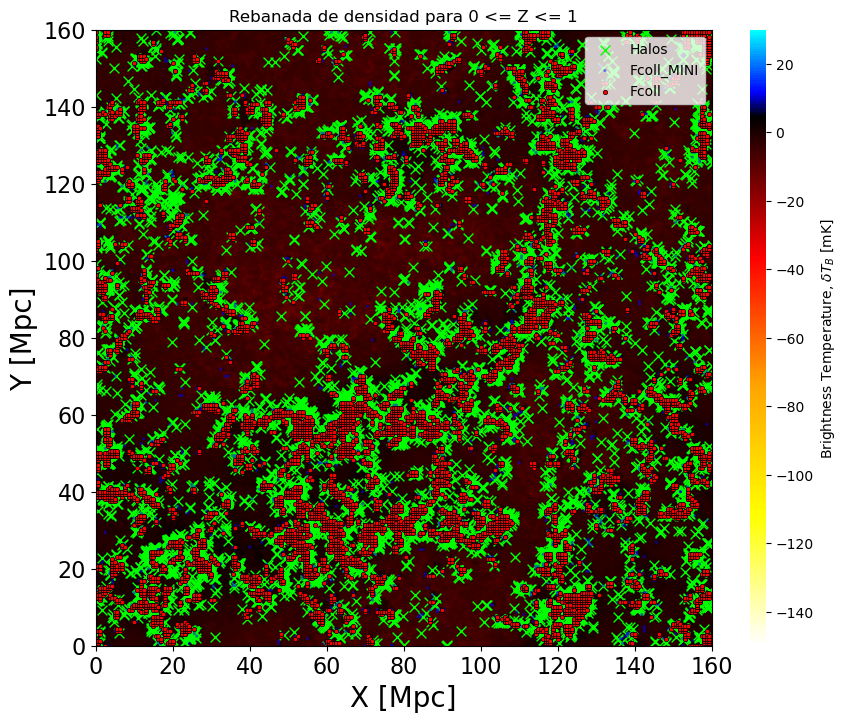

In [201]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()  # Dimensión original (128)

#DIM = 511
DIM = 1023

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll y Fcoll_MINI
    W = 46
    fcoll_data = coeval.Fcoll[W]
    fcoll_mini_data = coeval.Fcoll_MINI[W]

    # Umbral
    umbral = 0.08

    # Máscaras para Fcoll y Fcoll_MINI
    mask_fcoll = fcoll_data > umbral
    mask_fcoll_mini = fcoll_mini_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)
    fcoll_mini_data_masked = np.where(mask_fcoll_mini, fcoll_mini_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_mini, y_fcoll_mini, z_fcoll_mini = np.where(mask_fcoll_mini)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    x_fcoll_mini_scaled = scale_indices(x_fcoll_mini, original_dim, new_dim)
    y_fcoll_mini_scaled = scale_indices(y_fcoll_mini, original_dim, new_dim)
    z_fcoll_mini_scaled = scale_indices(z_fcoll_mini, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    mask_z_slice_fcoll_mini = (z_fcoll_mini_scaled >= zmin) & (z_fcoll_mini_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    x_fcoll_mini_slice = x_fcoll_mini_scaled[mask_z_slice_fcoll_mini]
    y_fcoll_mini_slice = y_fcoll_mini_scaled[mask_z_slice_fcoll_mini]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    num_halos_fcoll_mini = np.sum(mask_z_slice_fcoll_mini)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')
    print(f'Número de mini halos (Fcoll_MINI) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll_mini}')

    
    plt.figure(figsize=(10, 10))

    # PLOT DEL CAMPO :  en este caso es el IONIZADO
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=1, cbar=True, ax=ax)
    
    
    #plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6)
    plt.title(f'Rebanada de densidad para {zmin} <= Z <= {zmax}')
# ----------------------------------------------------------------------------------------------------------
    #  halos
 #   plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='b', marker='o', s=100, label='Halos')

    
   # plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
   #         c='b',           # Color de los puntos (azul)
   #         edgecolor='w',   # Color del borde (blanco)
   #         marker='X',
   #         alpha=1,
   #         s=50, 
   #         label='Halos')
    
    
    #Fcoll y Fcoll_MINI en la rebanada
   # plt.scatter(
  #      x_fcoll_slice, y_fcoll_slice,
  #      c='lime',               # Color del punto
  #      edgecolor='black',     # Color del borde
  #      linewidths=0.5,          # Grosor del borde
  #      label='Fcoll',
  #      alpha=1,
  #      s=20
  #  )
# --------------------------------------------------------------------------------------------------------   
     # HALOS
    
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
            facecolor='lime', s=50, label='Halos', 
            linewidth=1, marker='x', color='lime')    
    
    
    
    # Fcoll_MINI
    plt.scatter(
        x_fcoll_mini_slice, y_fcoll_mini_slice,
        c='blue',              # Color del punto
        edgecolor='None',     # Color del borde
        linewidths=0.5,          # Grosor del borde
        label='Fcoll_MINI',
        alpha=0.5,
        s=5
    )

    # Fcoll
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='red',               # Color del punto
        edgecolor='black',     # Color del borde
        linewidths=0.5,          # Grosor del borde
        label='Fcoll',
        alpha=1,
        s=10
    )
   
   
        # HALOS
    #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
    #        c='b',           # Color de los puntos (azul)
    #        edgecolor='w',   # Color del borde (blanco)
    #        marker='X',
    #        alpha=1,
    #        s=50, 
    #        label='Halos')
    
    
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', s=50, label='Halos', 
#            linewidth=1, marker='x', color='lime')  
# --------------------------------------------------------------------------------------------    
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10) 
    

    
    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
    #plt.legend(loc='upper right')
    plt.tick_params(axis='both', labelsize=16)  

#    plt.legend()
    plt.savefig('tb BOX fcoll,fcollmini.jpg', dpi=300, bbox_inches='tight')
    #plt.savefig('IONIZACION BOX fcoll.jpg', dpi=300, bbox_inches='tight')

    
    plt.show()


# iii) Campo Ionizante ($\ X HII $) + HALOS

Número de halos (Fcoll) en el rango de z (0, 1): 9435
Número de mini halos (Fcoll_MINI) en el rango de z (0, 1): 9762


<Figure size 1000x1000 with 0 Axes>

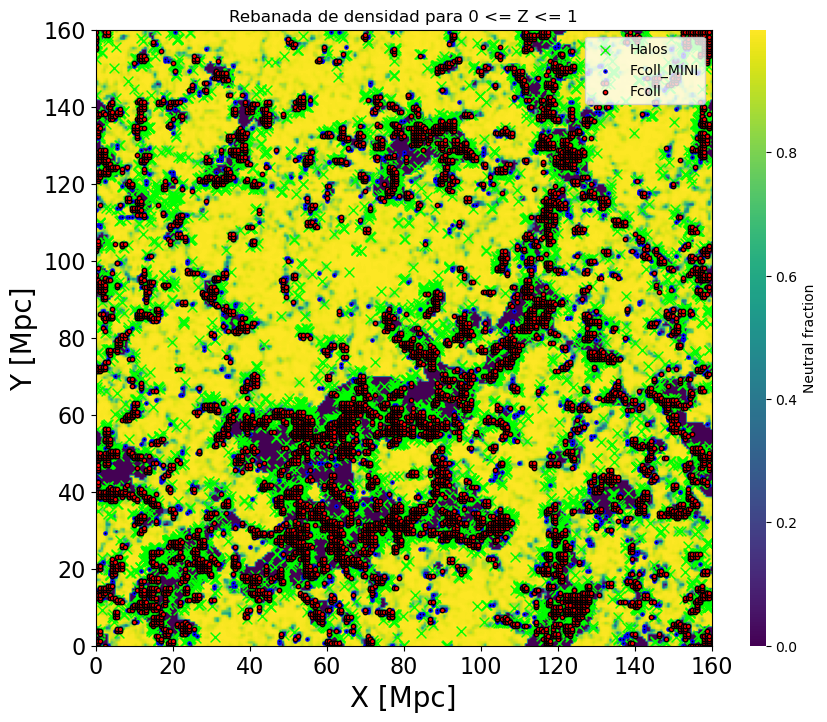

In [215]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()  # Dimensión original (128)

#DIM = 511
DIM = 1023

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll y Fcoll_MINI
    W = 46
    fcoll_data = coeval.Fcoll[W]
    fcoll_mini_data = coeval.Fcoll_MINI[W]

    # Umbral
    umbral = 0.08

    # Máscaras para Fcoll y Fcoll_MINI
    mask_fcoll = fcoll_data > umbral
    mask_fcoll_mini = fcoll_mini_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)
    fcoll_mini_data_masked = np.where(mask_fcoll_mini, fcoll_mini_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_mini, y_fcoll_mini, z_fcoll_mini = np.where(mask_fcoll_mini)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    x_fcoll_mini_scaled = scale_indices(x_fcoll_mini, original_dim, new_dim)
    y_fcoll_mini_scaled = scale_indices(y_fcoll_mini, original_dim, new_dim)
    z_fcoll_mini_scaled = scale_indices(z_fcoll_mini, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    mask_z_slice_fcoll_mini = (z_fcoll_mini_scaled >= zmin) & (z_fcoll_mini_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    x_fcoll_mini_slice = x_fcoll_mini_scaled[mask_z_slice_fcoll_mini]
    y_fcoll_mini_slice = y_fcoll_mini_scaled[mask_z_slice_fcoll_mini]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    num_halos_fcoll_mini = np.sum(mask_z_slice_fcoll_mini)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')
    print(f'Número de mini halos (Fcoll_MINI) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll_mini}')

    
    plt.figure(figsize=(10, 10))

    # PLOT DEL CAMPO :  en este caso es el IONIZADO
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
    
    
    #plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6)
    plt.title(f'Rebanada de densidad para {zmin} <= Z <= {zmax}')

    #  halos
    #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='b', marker='o', s=100, label='Halos')

    
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            c='b',           # Color de los puntos (azul)
#            edgecolor='w',   # Color del borde (blanco)
#            marker='o',
#            alpha=1,
#            s=30, 
#            label='Halos')
    
    
    #Fcoll y Fcoll_MINI en la rebanada
#    plt.scatter(
#        x_fcoll_slice, y_fcoll_slice,
#        c='lime',               # Color del punto
#        edgecolor='black',     # Color del borde
#        linewidths=2,          # Grosor del borde
#        label='Fcoll',
#        alpha=1,
#        s=20
#    )
#    plt.scatter(
#        x_fcoll_mini_slice, y_fcoll_mini_slice,
#        c='blue',              # Color del punto
#        edgecolor='white',     # Color del borde
#        linewidths=1,          # Grosor del borde
#        label='Fcoll_MINI',
#        alpha=1,
#        s=10
#    )

# -----------------------------------------------------------------------------------------------------    
    # HALOS

    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
            facecolor='lime', s=50, label='Halos', 
            linewidth=1, marker='x', color='lime')  





    # Fcoll_MINI    
    plt.scatter(
        x_fcoll_mini_slice, y_fcoll_mini_slice,
        c='0',              
        edgecolor='blue',     
        linewidths=1,          
        label='Fcoll_MINI',
        alpha=1,
        s=5
    ),

    # Fcoll 
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='r',               # Color del punto
        edgecolor='black',     # Color del borde
        linewidths=1,          # Grosor del borde
        label='Fcoll',
        alpha=1,
        s=10
    ),
    
    
      #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=100, label='Halos')
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', edgecolor='0', s=50, label='Halos', linewidth=1 )


    # HALOS

#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', s=50, label='Halos', 
#            linewidth=1, marker='x', color='lime')  

    
    
    
# ----------------------------------------------------------------------------------------------------------    
    
    
    
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10) 
    plt.tick_params(axis='both', labelsize=16)  

    
    
    
    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
    #plt.legend(loc='upper right')

#    plt.legend()
    plt.savefig('IONIZACION BOX fcoll,fcollmini.jpg', dpi=300, bbox_inches='tight')
    #plt.savefig('IONIZACION BOX fcoll.jpg', dpi=300, bbox_inches='tight')

    
    plt.show()


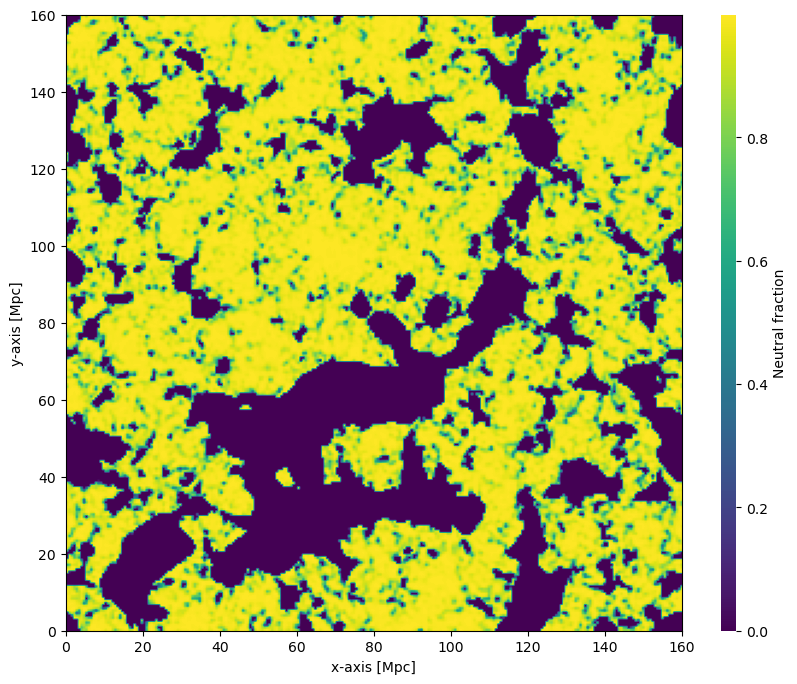

In [216]:
#plotting.coeval_sliceplot(coeval, "xH_box",slice_axis=-1, slice_index=0)

 # fig, ax = plt.subplots(figsize=(10, 8))  
 #   im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6, cbar=True, cmap='viridis', ax=ax)
    


fig, ax = plt.subplots(figsize=(10, 8))  # Ajusta el tamaño de la figura
im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0, cbar=True,cmap='viridis', ax=ax)
#plt.savefig('Ionizante CON mini.jpg', dpi=300, bbox_inches='tight')


# Temperatura cinetica del GAS Tk

Número de halos (Fcoll) en el rango de z (0, 1): 9435
Número de mini halos (Fcoll_MINI) en el rango de z (0, 1): 9762


<Figure size 1000x1000 with 0 Axes>

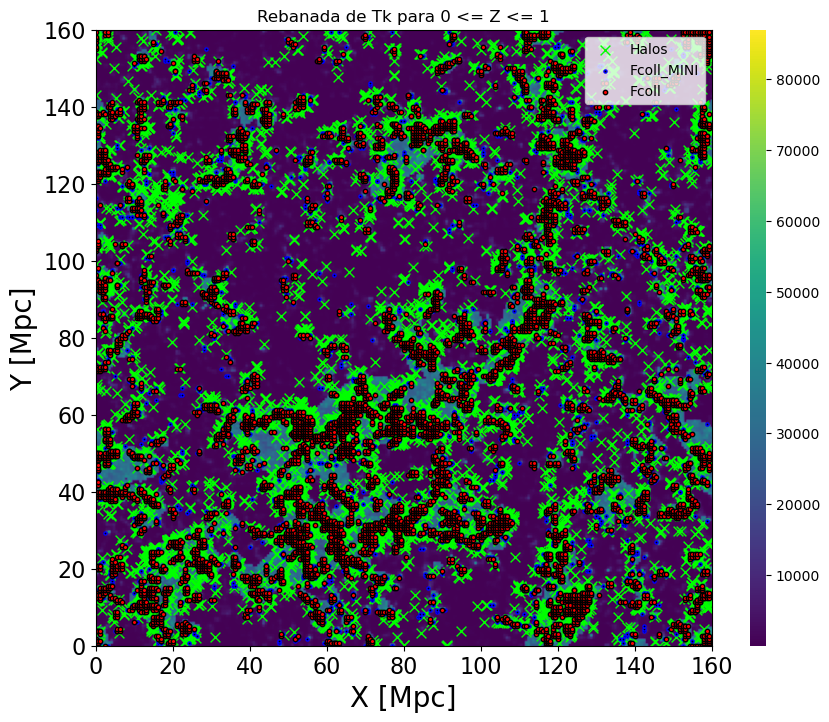

In [219]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()  # Dimensión original (128)

#DIM = 511
DIM = 1023

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll y Fcoll_MINI
    W = 46
    fcoll_data = coeval.Fcoll[W]
    fcoll_mini_data = coeval.Fcoll_MINI[W]

    # Umbral
    umbral = 0.08

    # Máscaras para Fcoll y Fcoll_MINI
    mask_fcoll = fcoll_data > umbral
    mask_fcoll_mini = fcoll_mini_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)
    fcoll_mini_data_masked = np.where(mask_fcoll_mini, fcoll_mini_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_mini, y_fcoll_mini, z_fcoll_mini = np.where(mask_fcoll_mini)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    x_fcoll_mini_scaled = scale_indices(x_fcoll_mini, original_dim, new_dim)
    y_fcoll_mini_scaled = scale_indices(y_fcoll_mini, original_dim, new_dim)
    z_fcoll_mini_scaled = scale_indices(z_fcoll_mini, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    mask_z_slice_fcoll_mini = (z_fcoll_mini_scaled >= zmin) & (z_fcoll_mini_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    x_fcoll_mini_slice = x_fcoll_mini_scaled[mask_z_slice_fcoll_mini]
    y_fcoll_mini_slice = y_fcoll_mini_scaled[mask_z_slice_fcoll_mini]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    num_halos_fcoll_mini = np.sum(mask_z_slice_fcoll_mini)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')
    print(f'Número de mini halos (Fcoll_MINI) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll_mini}')

    
    plt.figure(figsize=(10, 10))

    # PLOT DEL CAMPO :  en este caso es el IONIZADO
    
    fig, ax = plt.subplots(figsize=(10, 8))  # Ajusta el tamaño de la figura
    im = plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=1, cbar=True,cmap='viridis', ax=ax)
    
    #plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=0)

    
    #plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6)
    plt.title(f'Rebanada de Tk para {zmin} <= Z <= {zmax}')

    #  halos
    #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='b', marker='o', s=100, label='Halos')

    
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            c='b',           # Color de los puntos (azul)
#            edgecolor='w',   # Color del borde (blanco)
#            marker='o',
#            alpha=1,
#            s=20, 
#            label='Halos')
    
    
    #Fcoll y Fcoll_MINI en la rebanada
#    plt.scatter(
#        x_fcoll_slice, y_fcoll_slice,
#        c='red',               # Color del punto
#        edgecolor='black',     # Color del borde
#        linewidths=1,          # Grosor del borde
#        label='Fcoll',
#        alpha=1,
#       s=10
#    )
#    plt.scatter(
#        x_fcoll_mini_slice, y_fcoll_mini_slice,
#        c='blue',              # Color del punto
#        edgecolor='white',     # Color del borde
#        linewidths=2,          # Grosor del borde
#        label='Fcoll_MINI',
#        alpha=1,
#        s=5
#    )

# ------------------------------------------------------------------------------------------------------
    # HALOS

    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
            facecolor='lime', s=50, label='Halos', 
            linewidth=1, marker='x', color='lime') 




    # Fcoll_MINI    MINI HALOS
    plt.scatter(
        x_fcoll_mini_slice, y_fcoll_mini_slice,
        c='0',              
        edgecolor='blue',     
        linewidths=1,          
        label='Fcoll_MINI',
        alpha=1,
        s=5
    ),

    # Fcoll HALOS
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='r',               # Color del punto
        edgecolor='black',     # Color del borde
        linewidths=1,          # Grosor del borde
        label='Fcoll',
        alpha=1,
        s=10
    ),
    
    
      #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=100, label='Halos')
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', edgecolor='0', s=50, label='Halos', linewidth=1 )


    # HALOS

#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', s=50, label='Halos', 
#            linewidth=1, marker='x', color='lime')  

    

# -----------------------------------------------------------------------------------------------------
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10) 
    
    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
    #plt.legend(loc='upper right')

#    plt.legend()
    #plt.savefig('Tk BOX fcoll- fcollmini.jpg', dpi=300, bbox_inches='tight')
    #plt.savefig('IONIZACION BOX fcoll.jpg', dpi=300, bbox_inches='tight')
    plt.tick_params(axis='both', labelsize=16)  

    
    plt.show()

# Temperatura de spin

Número de halos (Fcoll) en el rango de z (0, 1): 9435
Número de mini halos (Fcoll_MINI) en el rango de z (0, 1): 9762


<Figure size 1000x1000 with 0 Axes>

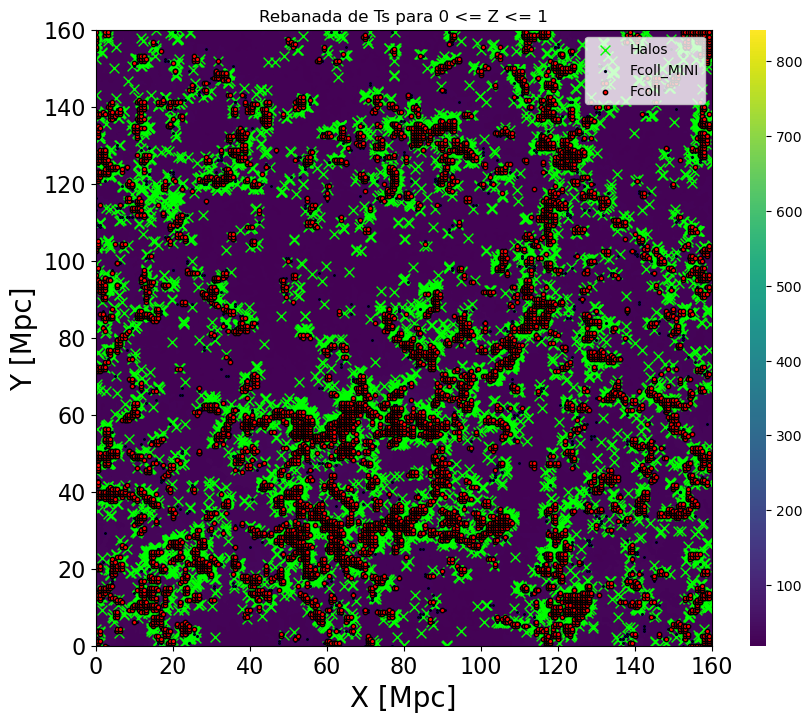

In [221]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()  # Dimensión original (128)

#DIM = 511
DIM = 1023


# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll y Fcoll_MINI
    W = 46
    fcoll_data = coeval.Fcoll[W]
    fcoll_mini_data = coeval.Fcoll_MINI[W]

    # Umbral
    umbral = 0.08

    # Máscaras para Fcoll y Fcoll_MINI
    mask_fcoll = fcoll_data > umbral
    mask_fcoll_mini = fcoll_mini_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)
    fcoll_mini_data_masked = np.where(mask_fcoll_mini, fcoll_mini_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_mini, y_fcoll_mini, z_fcoll_mini = np.where(mask_fcoll_mini)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    x_fcoll_mini_scaled = scale_indices(x_fcoll_mini, original_dim, new_dim)
    y_fcoll_mini_scaled = scale_indices(y_fcoll_mini, original_dim, new_dim)
    z_fcoll_mini_scaled = scale_indices(z_fcoll_mini, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    mask_z_slice_fcoll_mini = (z_fcoll_mini_scaled >= zmin) & (z_fcoll_mini_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    x_fcoll_mini_slice = x_fcoll_mini_scaled[mask_z_slice_fcoll_mini]
    y_fcoll_mini_slice = y_fcoll_mini_scaled[mask_z_slice_fcoll_mini]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    num_halos_fcoll_mini = np.sum(mask_z_slice_fcoll_mini)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')
    print(f'Número de mini halos (Fcoll_MINI) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll_mini}')

    
    plt.figure(figsize=(10, 10))

    # PLOT DEL CAMPO :  en este caso es el IONIZADO
    #plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=0)
     
    fig, ax = plt.subplots(figsize=(10, 8))  # Ajusta el tamaño de la figura
    im = plotting.coeval_sliceplot(coeval, "Ts_box", slice_axis=-1, slice_index=1, cbar=True,cmap='viridis', ax=ax)
    
    
   # plotting.coeval_sliceplot(coeval, "Ts_box",slice_axis=-1, slice_index=0)

    
    #plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6)
    plt.title(f'Rebanada de Ts para {zmin} <= Z <= {zmax}')

    #  halos
    #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='b', marker='o', s=100, label='Halos')

    
#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            c='none',           # Color de los puntos (azul)
#            edgecolor='w',   # Color del borde (blanco)
#            marker='o',
#            alpha=1,
#            s=20, 
#            label='Halos')
    
    
    #Fcoll y Fcoll_MINI en la rebanada
#    plt.scatter(
#        x_fcoll_slice, y_fcoll_slice,
#        c='none',               # Color del punto
#        edgecolor='red',     # Color del borde
#        linewidths=1,          # Grosor del borde
#        label='Fcoll',
#        alpha=1,
#       s=20
#    )
    
#    plt.scatter(
#        x_fcoll_mini_slice, y_fcoll_mini_slice,
#        c='none',              # Color del punto
#        edgecolor='b',     # Color del borde
#        linewidths=1,          # Grosor del borde
#        label='Fcoll_MINI',
#        alpha=1,
#        s=20
#    )

    
# -------------------------------------------------------------------------------------


    # HALOS

    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
            facecolor='lime', s=50, label='Halos', 
            linewidth=1, marker='x', color='lime') 





    # Fcoll_MINI    MINI HALOS
    plt.scatter(
        x_fcoll_mini_slice, y_fcoll_mini_slice,
        c='0',              
        edgecolor='blue',     
        linewidths=0.1,          
        label='Fcoll_MINI',
        alpha=1,
        s=5
    ),

    # Fcoll HALOS
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='r',               # Color del punto
        edgecolor='black',     # Color del borde
        linewidths=1,          # Grosor del borde
        label='Fcoll',
        alpha=1,
        s=10
    ),
    
 

    # HALOS

#    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
#            facecolor='lime', s=50, label='Halos', 
#            linewidth=1, marker='x', color='lime')   

    


# -------------------------------------------------------------------------------------
    
    
    
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10) 
    
    plt.tick_params(axis='both', labelsize=16)  

    
   # plt.xlabel('X [Mpc]')
   # plt.ylabel('Y [Mpc]')
   # plt.legend(loc='upper right')

#    plt.legend()
    plt.savefig('Ts BOX fcoll- fcollmini.jpg', dpi=300, bbox_inches='tight')
    #plt.savefig('IONIZACION BOX fcoll.jpg', dpi=300, bbox_inches='tight')

    
    plt.show()


# HMF

In [186]:
halos.fgtrm

array([3.7759426e-06, 9.4497855e-06, 1.8685943e-05, 3.2564465e-05,
       5.5022923e-05, 8.8468347e-05, 1.4098821e-04, 2.2143686e-04,
       3.3184301e-04, 4.7959728e-04, 6.7932863e-04, 9.3349500e-04,
       1.2615046e-03, 1.6496085e-03, 2.0878986e-03, 2.6158222e-03,
       3.1685163e-03, 3.9557139e-03, 4.6826331e-03, 5.4363906e-03,
       6.1820126e-03, 8.6116688e-03], dtype=float32)

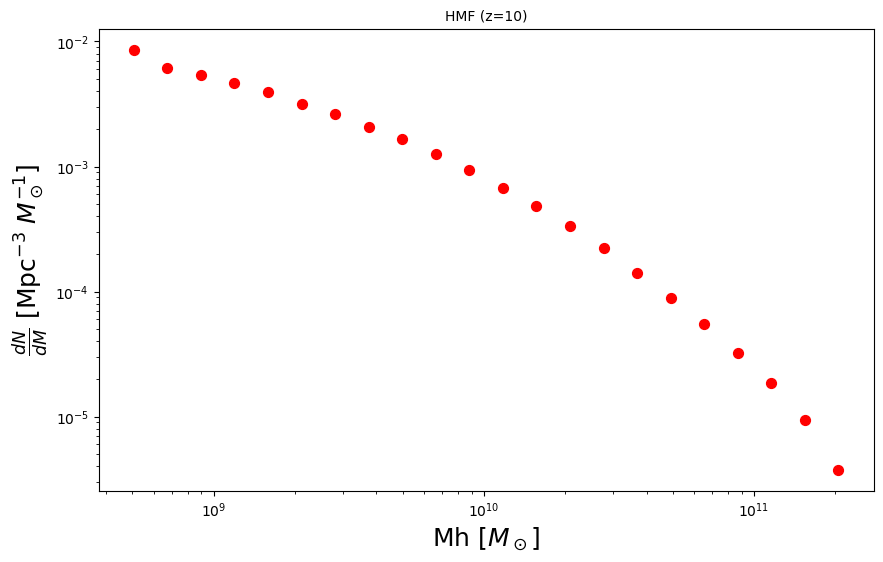

In [188]:
import numpy as np
import matplotlib.pyplot as plt

mass_bins = halos.mass_bins
fgtrm = halos.fgtrm  

plt.figure(figsize=(10, 6))

plt.scatter(mass_bins, fgtrm, label='Término fgtrm', color='red', s=50)  

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'Mh [$M_\odot$]', fontsize=18)

#   plt.ylabel(r'$\frac{dN}{dM}$ ()', fontsize=16)  
plt.ylabel(r'$\frac{dN}{dM}$ [Mpc$^{-3}$ $M_\odot^{-1}$]', fontsize=18)




plt.title('HMF (z=10)', fontsize=10)  
#plt.grid()
plt.savefig('HMF.jpg', dpi=300, bbox_inches='tight')

plt.show()
